# Problem 1: Linear Regression

The comp-activ databases is a collection of a computer systems activity measures .
The data was collected from a Sun Sparcstation 20/712 with 128 Mbytes of memory running in a multi-user university department. Users would typically be doing a large variety of tasks ranging from accessing the internet, editing files or running very cpu-bound programs. 

As you are a budding data scientist you thought to find out a linear equation to build a model to predict 'usr'(Portion of time (%) that cpus run in user mode) and to find out how each attribute affects the system to be in 'usr' mode using a list of system attributes.

In [515]:
import numpy as np   
import pandas as pd    
from sklearn.linear_model import LinearRegression
from sklearn import metrics

# for visualizing data
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.style

# For randomized data splitting
from sklearn.model_selection import train_test_split

# To build linear regression_model
import statsmodels.api as sm

# To check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import r2_score
import sklearn.metrics as metrics
from warnings import filterwarnings
filterwarnings("ignore")
plt.style.use('ggplot')
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,plot_confusion_matrix

### 1.1 Read the data and do exploratory data analysis. Describe the data briefly. (Check the Data types, shape, EDA, 5 point summary). Perform Univariate, Bivariate Analysis, Multivariate Analysis.

**Importing data**

In [516]:
# reading the CSV file into pandas dataframe

df_comp = pd.read_excel("compactiv.xlsx") 

In [517]:
# Checking top few records to get a feel of the data structure

df_comp.head().T

,0,1,2,3,4
lread,1,0,15,0,5
lwrite,0,0,3,0,1
scall,2147,170,2162,160,330
sread,79,18,159,12,39
swrite,68,21,119,16,38
fork,0.2,0.2,2.0,0.2,0.4
exec,0.2,0.2,2.4,0.2,0.4
rchar,40671.0,448.0,NaN,NaN,NaN
wchar,53995.0,8385.0,31950.0,8670.0,12185.0
pgout,0.0,0.0,0.0,0.0,0.0


In [518]:
#To View the bottom 5 records

df_comp.tail().T

,8187,8188,8189,8190,8191
lread,16,4,16,32,2
lwrite,12,0,5,45,0
scall,3009,1596,3116,5180,985
sread,360,170,289,254,55
swrite,244,146,190,179,46
fork,1.6,2.4,0.6,1.2,1.6
exec,5.81,1.8,0.6,1.2,4.8
rchar,405250.0,89489.0,325948.0,62571.0,111111.0
wchar,85282.0,41764.0,52640.0,29505.0,22256.0
pgout,8.02,3.8,0.4,1.4,0.0


In [519]:
#checking column types and number of values. To Retreive the list of fields along with their data type

df_comp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

 * Most of the columns in the data are numeric in nature ('int64' or 'float64' type).
 * The "runqsz" column is alone string ('object' type).

In [8]:
# shape of dataset

print("no. of rows: ",df_comp.shape[0], "\n""no. of columns: ",df_comp.shape[1])

no. of rows:  8192 
no. of columns:  22


In [9]:
# summary of the dataset

df_comp.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
lread,8192.0,NaN,NaN,NaN,19.559692,53.353799,0.0,2.0,7.0,20.0,1845.0
lwrite,8192.0,NaN,NaN,NaN,13.106201,29.891726,0.0,0.0,1.0,10.0,575.0
scall,8192.0,NaN,NaN,NaN,2306.318237,1633.617322,109.0,1012.0,2051.5,3317.25,12493.0
sread,8192.0,NaN,NaN,NaN,210.47998,198.980146,6.0,86.0,166.0,279.0,5318.0
swrite,8192.0,NaN,NaN,NaN,150.058228,160.47898,7.0,63.0,117.0,185.0,5456.0
fork,8192.0,NaN,NaN,NaN,1.884554,2.479493,0.0,0.4,0.8,2.2,20.12
exec,8192.0,NaN,NaN,NaN,2.791998,5.212456,0.0,0.2,1.2,2.8,59.56
rchar,8088.0,NaN,NaN,NaN,197385.728363,239837.493526,278.0,34091.5,125473.5,267828.75,2526649.0
wchar,8177.0,NaN,NaN,NaN,95902.992785,140841.707911,1498.0,22916.0,46619.0,106101.0,1801623.0
pgout,8192.0,NaN,NaN,NaN,2.285317,5.307038,0.0,0.0,0.0,2.4,81.44


**Observation:**

•	Data has been loaded correctly into the pandas dataframe

•	There are 8192 rows and 22 columns

•	There are missing values in 'rchar', 'wchar' columns as the count of the columns is less than 8192.

•	The ‘pgscan’ and ‘atch’ variable has 75% values equal to 0.

•	The ‘pgout’ , ‘ppgout’, ‘pgfree’, ‘pgin’ , ‘ppgin’ variables has 50% values equal to 0.




### Unique values for Categorical Variables

In [10]:
# unique value in object datatype

for column in df_comp.columns:
    if df_comp[column].dtype == 'object':
        print(column.upper(),': ',df_comp[column].nunique())
        print(df_comp[column].value_counts().sort_values())


RUNQSZ :  2
CPU_Bound        3861
Not_CPU_Bound    4331
Name: runqsz, dtype: int64


## EDA

**For Numeric Variable**

In [12]:
df_comp_num = df_comp.select_dtypes(include = ['float64', 'int64'])
numeric_columns = list(df_comp_num.columns.values)
print("The number of Numeric columns in the dataset is: ",len(numeric_columns))

The number of Numeric columns in the dataset is:  21


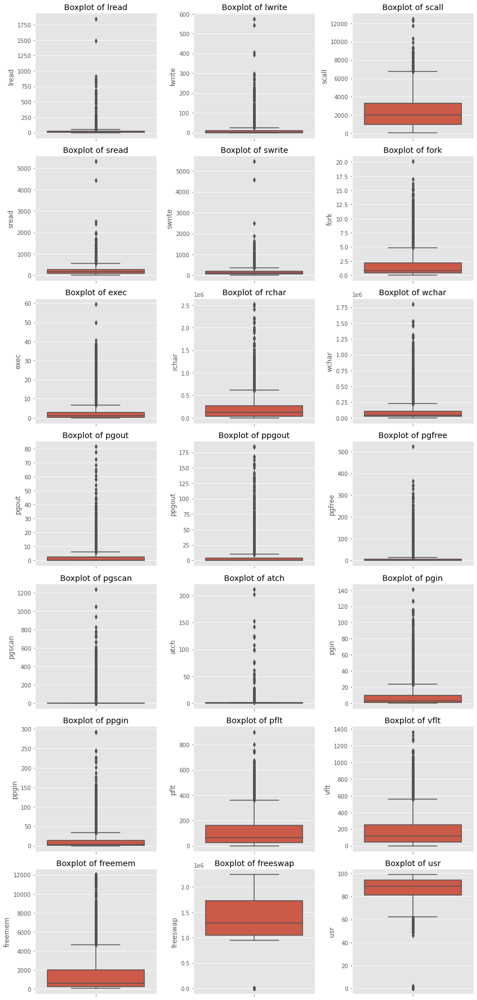

In [14]:
# using boxplots on numeric columns

plt.figure(figsize = (12,25))
feature_list = df_comp_num.columns
for i in range(len(feature_list)):
    plt.subplot(7, 3 ,i +1)
    sns.boxplot(y = df_comp_num[feature_list[i]], data = df_comp)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

**Insights**

•	There are 21 numeric fields in the data

•	Outliers are present in all numeric fields.

•	The median value for “scall” is 2000 seconds which indicates that there are 2000 system calls per second.

•	The “pgin” attribute value has median value of 10 which means the Average Number of page in requests per second is 10.

•	“pflt” feature has average value of 50 which is average Number of page faults caused by protection errors (copy on writes) is 50.

•	“vflt” feature has average value of 100 which is average  Number of page faults caused by address translation is 100

•	Average Number of memory pages available to user processes is only 1700.

•	The Number of disk blocks available for page swapping is 1328125.

•	The mean value of “usr” variable is 83.








**Distribution Plot for Compactive Dataset**

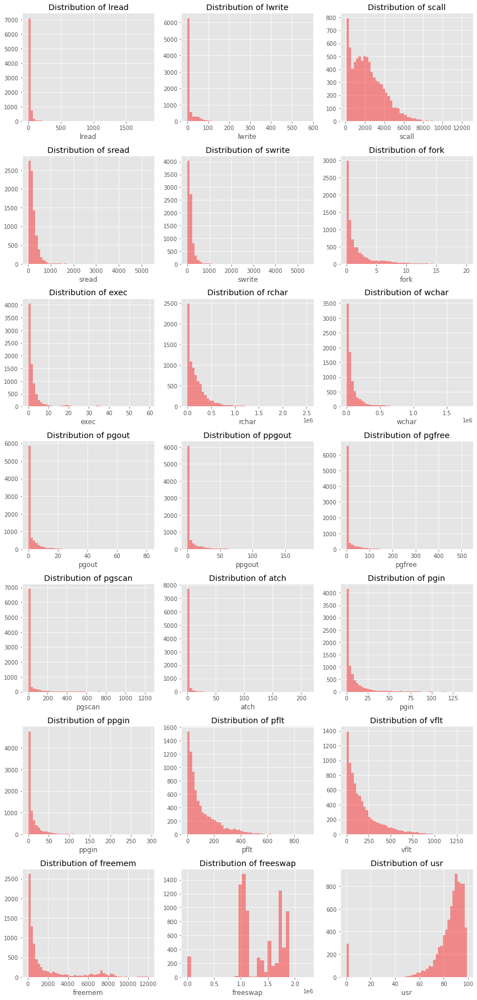

In [15]:
# using histplot on numeric columns

plt.figure(figsize = (12,25))
feature_list = df_comp_num.columns
for i in range(len(feature_list)):
    plt.subplot(7, 3 ,i +1)
    sns.distplot(df_comp[feature_list[i]], kde=False, color='r');
    plt.title('Distribution of {}'.format(feature_list[i]))
    plt.tight_layout()

**Insights**

 * The "usr" variable has more than 4000 values that uses memory more than 80% of time that cpus run in user mode.
 * The " pflt" and "vflt" is having values ranging between 0 to 400 and 0 to 700.
 * The "scall" has more values between 0 to 6000

**For Categorical Variable**

In [16]:
df_comp['runqsz'].value_counts()

Not_CPU_Bound    4331
CPU_Bound        3861
Name: runqsz, dtype: int64

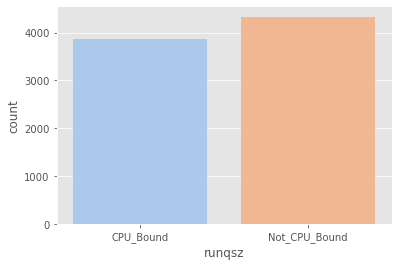

In [17]:
# using countplot for categorical variable

sns.countplot(x='runqsz', data=df_comp, palette='pastel');

**Insights**

"Not CPU Bound" has maximum count than CPU Bound which shows that Sun Sparcstation computers are not always CPU bound.

**Bivariate Analysis**

A bivariate analysis among the different variables can be done using scatter matrix plot. Seaborn libs create a dashboard reflecting useful information about the dimensions. The result can be stored as a .png file.

In [513]:
df_comp_num.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'usr'],
      dtype='object')

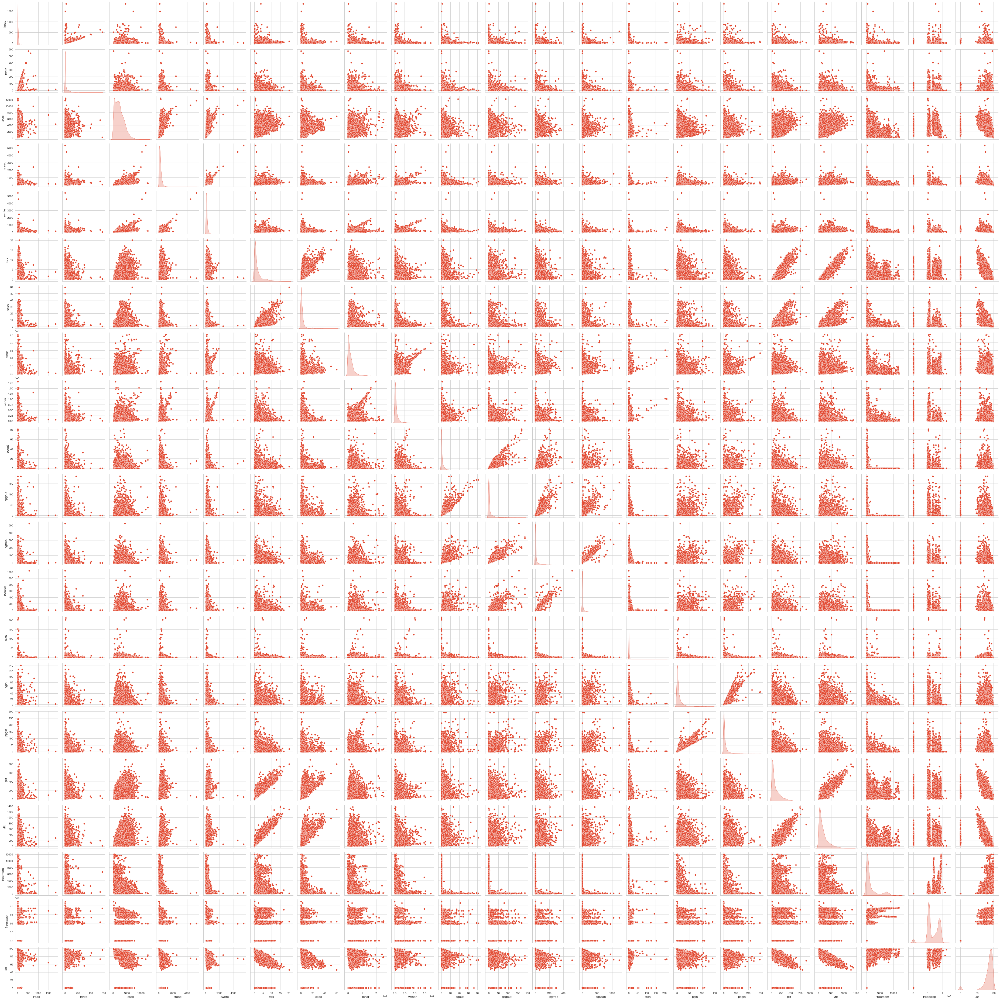

In [18]:
## Numeric vs Numeric
sns.set_style("whitegrid")
sns.pairplot(data = df_comp_num, diag_kind="kde");
plt.show();

In [514]:
df_comp_num.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'usr'],
      dtype='object')

**Insights**

 * Observing the relationship between 'usr' and other attributes is not really linear.
 * However, the plots also indicate that linearity would still capture quite a bit of useful information/pattern.
 * Several assumptions of classical linear regression seem to be violated.

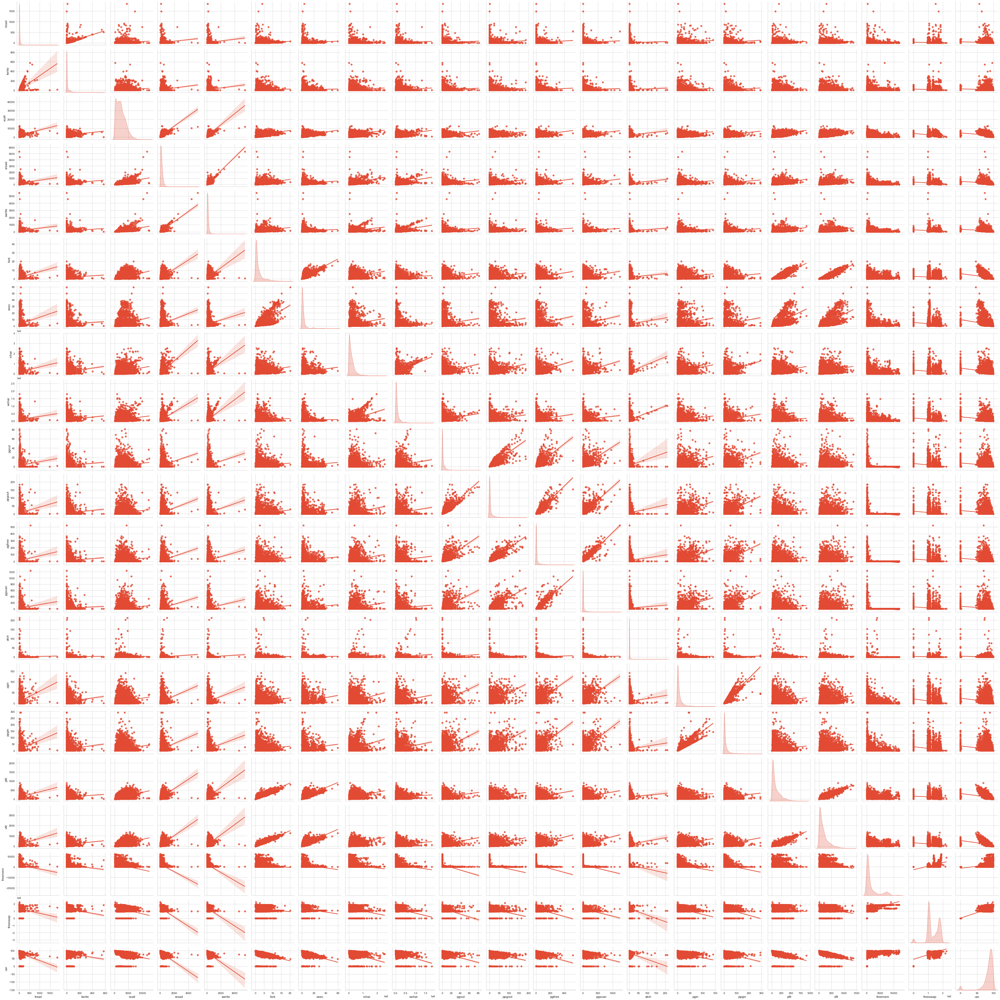

In [19]:
#Let's add a regression line to the above graph to get a better picture

sns.pairplot(data = df_comp_num, kind='reg', diag_kind = 'kde')

### **Observations**

*   Based on the regression lines in the above graphs, we may conclude that many paris of variables exhibit faint to considerable amounts of correlation
1. Usr and lread 
2. Usr and sread
3. Usr and fork
4. Usr and wchar
5. Usr and swrite
6. Usr and exec
7. Usr and rchar
8. Usr and wchar
9. Usr and pgscan
10. Usr and atch
11. Usr and pgin
12. Usr and ppgin
13. Usr and freeswap




*    Although we can say that there exists some relationship between variables, we can't quantify that from the above graphs. 
*    So, we need to quantify the amounts of correlation using Pearson Correlation and verify the above observations



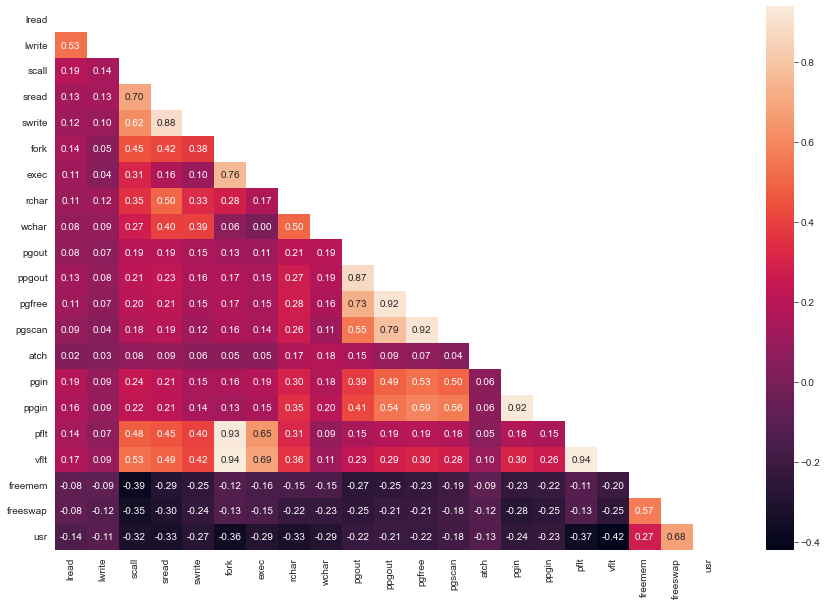

In [20]:
#to find correlation of data using Pearson Correlation

corr = df_comp_num.corr(method='pearson')

mask = np.triu(np.ones_like(corr, dtype=np.bool)) 
fig = plt.subplots(figsize=(15,10))
sns.heatmap(df_comp_num.corr(), annot=True,fmt='.2f',mask=mask)
plt.show()

**Insights**

 * pflt vs fork and vflt vs fork is highly correlated.
 * Similarly ppgout vs pgout, pgfree vs ppgout , pgscan vs pgfree , pgin vs ppgin , vflt vs pflt are strongly positively correlated.

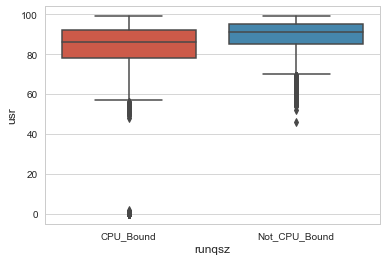

In [21]:
## Categorical vs Numeric

fig_dims = (12, 5)
sns.boxplot(y='usr', x='runqsz', data=df_comp );

**Insights**

* The median value for "Not CPU Bound" is higher. 

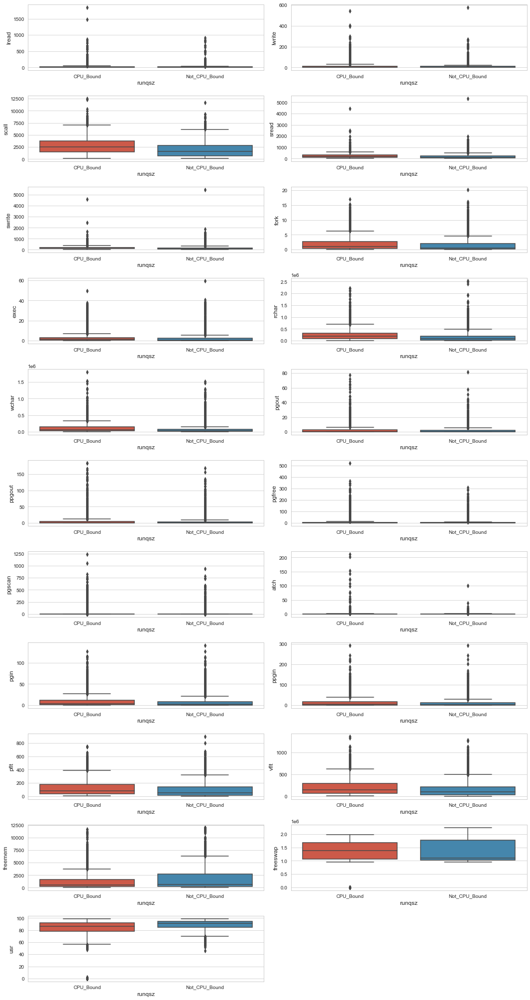

In [22]:
# between the independent categorical feature and the independent numeric features - suplots - 11 rows and 2 cols
# 100% stacked bar chart

fig,ax = plt.subplots(11,2, figsize=(15,28))
#plt.legend(['Runtime of CPU'], loc = 'center')  
for i, cols in enumerate(df_comp_num):
    sns.boxplot(y = df_comp_num[cols], x='runqsz', data=df_comp, ax=ax[i//2,i%2] )
plt.tight_layout()
fig.delaxes(ax[10][1])

**Insights**

1. Median value of usr with "CPU NOT BOUND" is higher.
2. On an average, freeswap use more CPU. Hence Number of disk blocks available for page swapping consumes more CPU.
3. Process runqueue size is less for freemem.
4. vflt (Number of page faults caused by address translation) has more run queue size and makes CPU Bound.
5. pflt (Number of page faults caused by protection errors (copy-on-writes) has more run queue size. Hence it make the system CPU bound.
6. ppgin and pgin uses comparitively similar run queue size.
7. The usage of CPU by pgscan , atch, pgfree , ppgout, pgout is very less.
8. The rchar attribute has higher influence on process run queue size which denotes that number of characters transferred per second by system read calls is higher.
9. The number of system fork calls per second has higher influence on runqsz.
10. "scall" -  Number of system calls of all types per second attribute has higher effect on CPU and its average CPU Bound value is higher.
11. lread and lwrite attributes has lesser effect on runqsz attribute and consumes less process run queue size.

**Multivariate Analysis**

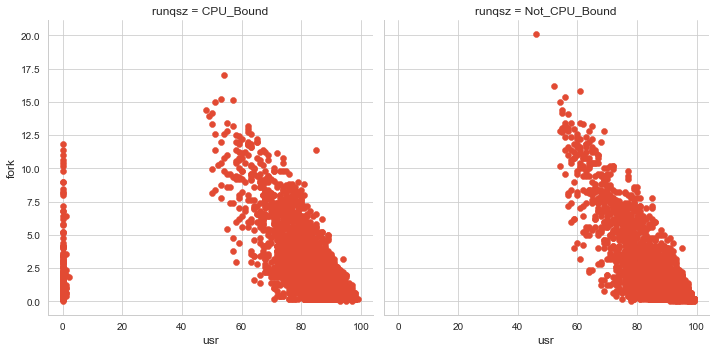

In [23]:
# using facetgrid

a1 = sns.FacetGrid(df_comp, col="runqsz",col_wrap=2, height=5);
a1 = a1.map(plt.scatter, "usr", 'fork')
a1.add_legend();

**Insights**

 * From the above plot, the 'usr' and 'fork' variable shows some pattern. 
 * Hence there is colliearity between these variables.

### 1.2 Impute null values if present, also check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them? Check for the possibility of creating new features if required. Also check for outliers and duplicates if there.

**Dealing with Missing Values**

In [520]:
df_comp.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

**Insights**

We can observe that "rchar" and "wchar" has Null values in the dataset.

**Imputing Null values in Dataset**

In [25]:
# checking column medians
df_comp.median()

lread             7.0
lwrite            1.0
scall          2051.5
sread           166.0
swrite          117.0
fork              0.8
exec              1.2
rchar        125473.5
wchar         46619.0
pgout             0.0
ppgout            0.0
pgfree            0.0
pgscan            0.0
atch              0.0
pgin              2.8
ppgin             3.8
pflt             63.8
vflt            120.4
freemem         579.0
freeswap    1289289.5
usr              89.0
dtype: float64

In [521]:
# Replacing the missing values with median values of the columns.

for column in df_comp.columns:
    if df_comp[column].dtype != 'object':
        median = df_comp[column].median()
        df_comp[column] = df_comp[column].fillna(median)

In [522]:
df_comp.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

**Checking for the values which are equal to zero**

In [28]:
# Checking for the values which are equal to zero

print("The column name with no. of values equal to 0 is given below \n")
count = 0
print("COLUMN  COUNT \n")
for column in df_comp.columns:
    for i in df_comp[column].values:
        if (i == 0):
            count += 1     
    if (count != 0):
        print(column,"=",count)
    count = 0

The column name with no. of values equal to 0 is given below 

COLUMN  COUNT 

lread = 675
lwrite = 2684
fork = 21
exec = 21
pgout = 4878
ppgout = 4878
pgfree = 4869
pgscan = 6448
atch = 4575
pgin = 1220
ppgin = 1220
pflt = 3
usr = 283


**We can see that 13 columns have values equal to 0. Among them,'pgscan' has around 6448 values are 0.**

In [29]:
df_comp.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.00,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.00,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.00,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.00,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.00,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.40,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.20,1.2,2.800,59.56
rchar,8192.0,1.964728e+05,238446.012054,278.0,34860.50,125473.5,265394.750,2526649.00
wchar,8192.0,9.581275e+04,140728.464118,1498.0,22977.75,46619.0,106037.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.00,0.0,2.400,81.44


In [523]:
#drop pgscan feature as 75% of the value is 0

df_comp.drop('pgscan', axis=1, inplace =True)

In [524]:
df_comp.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


**Insights**

 * pgscan column is dropped as 75% of the values is '0'

**Checking for duplicates**

In [525]:
# to find duplicates 

dups = df_comp.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))


Number of duplicate rows = 0


**Checking for Outliers**

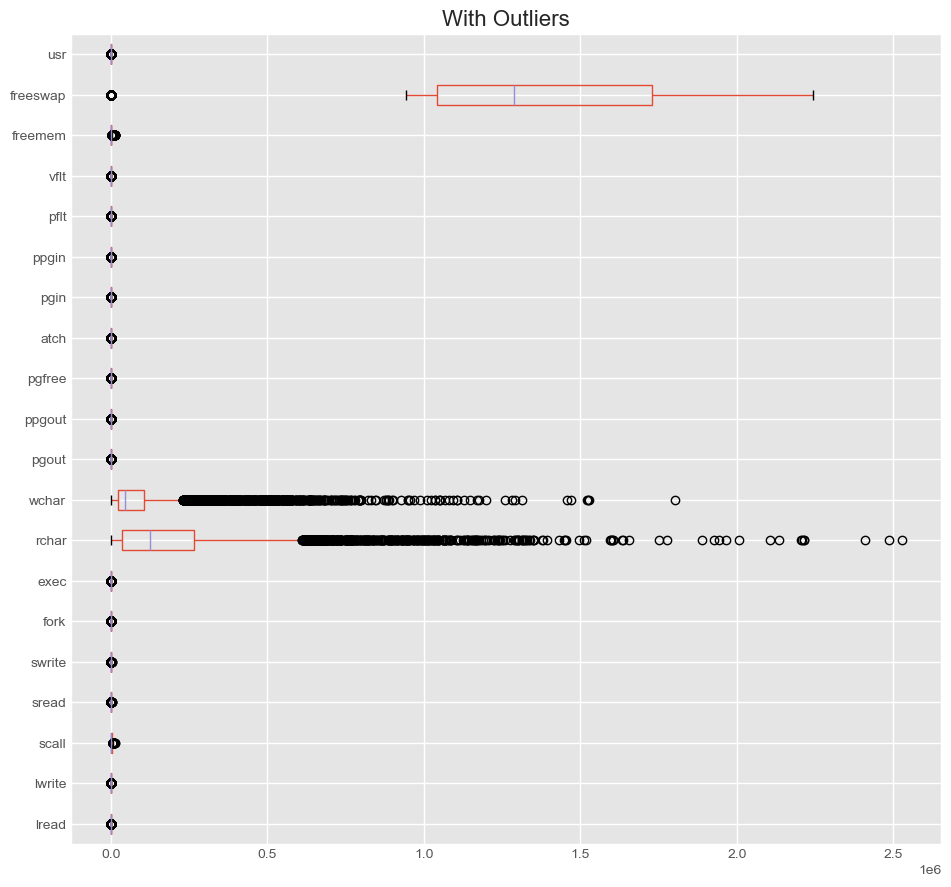

In [526]:
# constructing box plot for continuous variables

cont=df_comp.dtypes[(df_comp.dtypes!='object')].index
plt.figure(figsize=(10,10))
df_comp[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

We can see that "wchar" , "rchar" variables have presence of Outliers

**Outlier Treatment**

In [527]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [528]:
for column in df_comp[cont].columns:
    lr,ur=remove_outlier(df_comp[column])
    df_comp[column]=np.where(df_comp[column]>ur,ur,df_comp[column])
    df_comp[column]=np.where(df_comp[column]<lr,lr,df_comp[column])

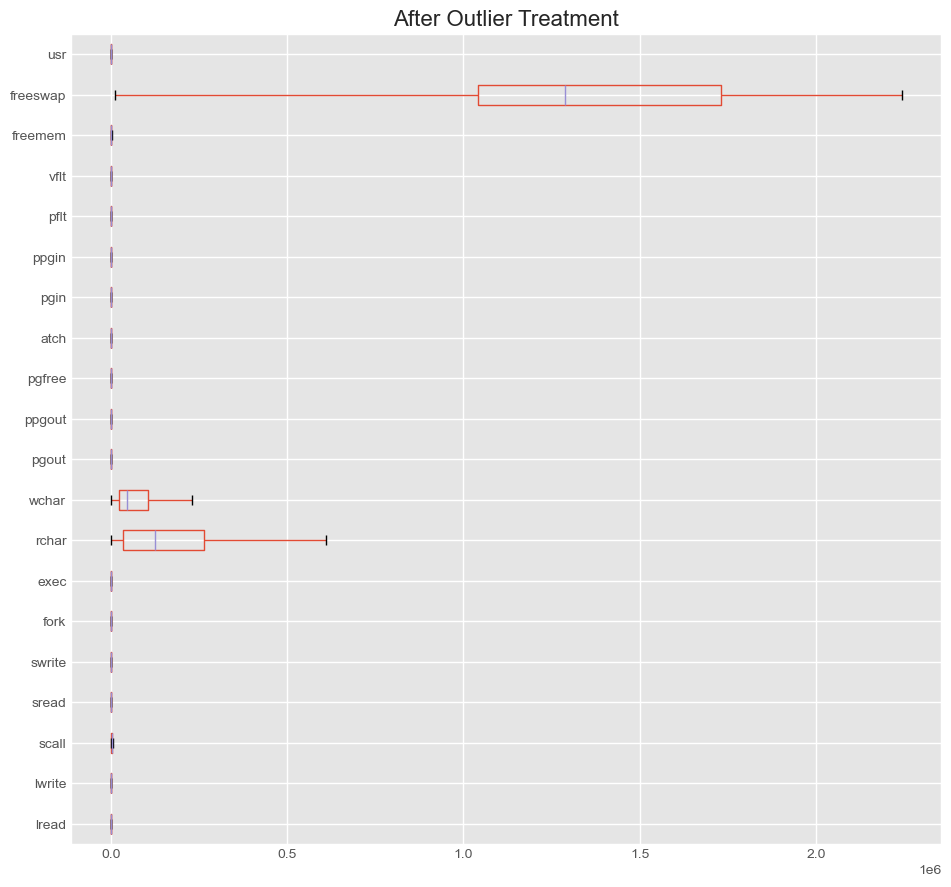

In [529]:
plt.figure(figsize=(10,10))
df_comp[cont].boxplot(vert=0)
plt.title('After Outlier Treatment',fontsize=16)
plt.show()

We can observe that there are no outliers for any columns.

### 1.3 Encode the data (having string values) for Modelling. Split the data into train and test (70:30). Apply Linear regression using scikit learn. Perform checks for significant variables using appropriate method from statsmodel. Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare. Compare these models and select the best one with appropriate reasoning.

**Create Dummy Variables**

We create 2 simple true or false columns with titles equivalent to "Is this CPU Bound or not Bound?". These will be used as independent variables without imposing any kind of ordering between the three regions.

We will also be dropping first column to ensure that there is no linear dependency between the two columns.

In [530]:
# drop_first=True will drop one of the three origin columns

df_comp = pd.get_dummies(df_comp, columns=["runqsz"], drop_first=True)
df_comp.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,95.0,0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,97.0,1
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,87.0,1
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,98.0,1
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,90.0,1


In [531]:
df_comp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   lread                 8192 non-null   float64
 1   lwrite                8192 non-null   float64
 2   scall                 8192 non-null   float64
 3   sread                 8192 non-null   float64
 4   swrite                8192 non-null   float64
 5   fork                  8192 non-null   float64
 6   exec                  8192 non-null   float64
 7   rchar                 8192 non-null   float64
 8   wchar                 8192 non-null   float64
 9   pgout                 8192 non-null   float64
 10  ppgout                8192 non-null   float64
 11  pgfree                8192 non-null   float64
 12  atch                  8192 non-null   float64
 13  pgin                  8192 non-null   float64
 14  ppgin                 8192 non-null   float64
 15  pflt                 

### Feature Engineering

**Split Data**

In [532]:
# Copying all the predictor variables into X dataframe
X = df_comp.drop('usr', axis=1)

# Copying target into the y dataframe. 
Y = df_comp[['usr']]

In [533]:
# let's add the intercept to data

X = sm.add_constant(X)

In [534]:
# Split X and Y into training and test set in 70:30 ratio

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.30 , random_state=1)

Data is now splitted to X and Y into train and test sets in a 70:30 ratio.

### Linear Regression Model using Scikit Learn

**Multiple Linear Regression Model**

The model is expressed as:
𝑦 = 𝑤0 + 𝑤1𝑥1 + 𝑤2𝑥2 + 𝑤3𝑥3 … … … … . . +𝑤𝑛𝑥𝑛
Where x1, x2, x3…….xn are the explanatory variables and y is target variable.

LinearRegression fits a linear model with coefficients w = (w1, …, wp) to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation.

In [42]:
# invoke the LinearRegression function and find the bestfit model on training data

regression_model = LinearRegression()
regression_model.fit(X_train, Y_train)

LinearRegression()

**Checks for significant variables using appropriate method from statsmodel**

In [43]:
# model accuracy

print("The Linear Regression model score using scikit Learn is ",regression_model.score(X, Y))


The Linear Regression model score using scikit Learn is  0.7877797449929932


In [44]:
# model coefficient

print(regression_model.coef_)

[[ 0.00000000e+00 -6.34815062e-02  4.81612871e-02 -6.63828011e-04
   3.08252103e-04 -5.42182230e-03  2.93127272e-02 -3.21166484e-01
  -5.16684176e-06 -5.40287524e-06 -3.68819064e-01 -7.65976821e-02
   8.44841447e-02  6.27574157e-01  1.99879077e-02 -6.73338398e-02
  -3.36028294e-02 -5.46366880e-03 -4.58467188e-04  8.83184026e-06
   1.61529785e+00]]


In [45]:
#model intercept value

print("The Linear Regression model intercept value is ",regression_model.intercept_)

The Linear Regression model intercept value is  [84.1217408]


In [46]:
# feature names in model

#print(regression_model.predict(np.array([[3, 5]])))

print(regression_model.feature_names_in_)


['const' 'lread' 'lwrite' 'scall' 'sread' 'swrite' 'fork' 'exec' 'rchar'
 'wchar' 'pgout' 'ppgout' 'pgfree' 'atch' 'pgin' 'ppgin' 'pflt' 'vflt'
 'freemem' 'freeswap' 'runqsz_Not_CPU_Bound']


**1. VIF of the predictors**

In [47]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series))

VIF values: 

const                   29.229332
lread                    5.350560
lwrite                   4.328397
scall                    2.960609
sread                    6.420172
swrite                   5.597135
fork                    13.035359
exec                     3.241417
rchar                    2.133616
wchar                    1.584381
pgout                   11.360363
ppgout                  29.404223
pgfree                  16.496748
atch                     1.875901
pgin                    13.809339
ppgin                   13.951855
pflt                    12.001460
vflt                    15.971049
freemem                  1.961304
freeswap                 1.841239
runqsz_Not_CPU_Bound     1.156815
dtype: float64



* The VIF values indicate that the features vflt, pflt, ppgin, pgin, pgfree, ppgout, pgout, fork, swrite, sread, lwrite, lread and scall are correlated with one or more independent features.

* Multicollinearity affects only the specific independent variables that are correlated.

* To treat multicollinearity, we will have to drop one or more of the correlated features.

* We will drop the variable that has the least impact on the adjusted R-squared of the model.

In [48]:
#Calculate MSE on train

predicted_train=regression_model.predict(X_train)

mse_train = metrics.mean_squared_error(Y_train,predicted_train)
print("The MSE on Train data using Linear Regression (using scikit) model is ",mse_train)

The MSE on Train data using Linear Regression (using scikit) model is  19.532299277152052


In [49]:
len(X_train)

5734

In [50]:
#RMSE on train 

np.sqrt(mse_train) 
print("The RMSE on Train data using Linear Regression (using scikit) model is ",np.sqrt(mse_train))

The RMSE on Train data using Linear Regression (using scikit) model is  4.419536092979902


In [51]:
# Prediction on Test data

predicted_test = regression_model.predict(X_test)

#Calculate MSE on test

mse_test=metrics.mean_squared_error(Y_test,predicted_test)
mse_test
print("The MSE on Test data using Linear Regression (using scikit) model is ",mse_test)

The MSE on Test data using Linear Regression (using scikit) model is  21.6438553192443


In [52]:
#RMSE on test

np.sqrt(mse_test)
print("The RMSE on Test data using Linear Regression (using scikit) model is ",np.sqrt(mse_test))

The RMSE on Test data using Linear Regression (using scikit) model is  4.652295704192103


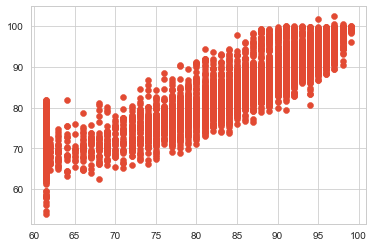

In [53]:
plt.scatter(Y_train, predicted_train)
plt.show()

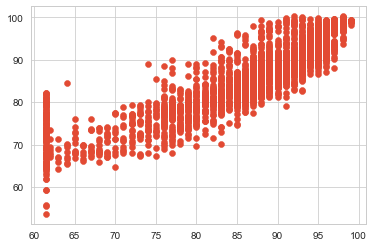

In [54]:
plt.scatter(Y_test, predicted_test)
plt.show()

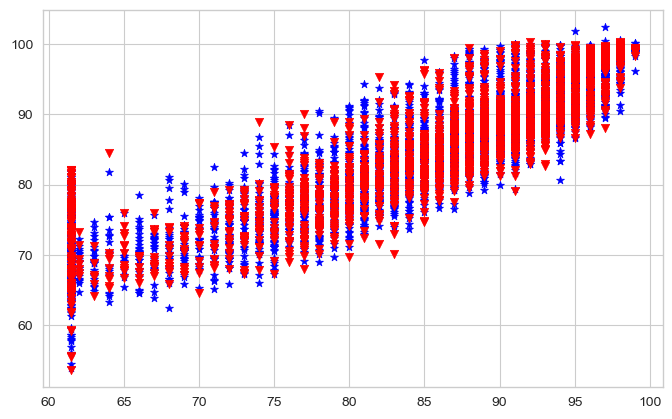

In [55]:
plt.rcParams.update({'figure.figsize':(8,5), 'figure.dpi':100})
plt.scatter(Y_train, predicted_train, color='blue', marker= '*', label='Train Data');
plt.scatter(Y_test, predicted_test, color= 'red', marker='v', label='Test Data');

In [56]:
X_train.head()

,const,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,...,ppgout,pgfree,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
694,1.0,1.0,1.0,1345.0,223.0,192.0,0.6,0.6,198703.0,230625.875,...,6.20,12.50,1.5,3.80,7.40,28.20,56.60,121.0,1375446.0,0
5535,1.0,1.0,1.0,1429.0,87.0,67.0,0.2,0.2,7163.0,24842.000,...,0.00,0.00,0.0,1.60,1.60,15.77,30.74,1476.0,1021541.0,1
4244,1.0,47.0,25.0,3273.0,225.0,180.0,0.6,0.4,83246.0,53705.000,...,7.19,7.19,1.5,3.99,4.59,59.88,74.05,82.0,10989.5,0
2472,1.0,13.0,8.0,4349.0,300.0,191.0,2.8,3.0,96009.0,70467.000,...,0.00,0.00,0.0,2.80,3.20,129.00,236.80,772.0,993909.0,0
7052,1.0,17.0,23.0,225.0,13.0,13.0,0.4,1.6,17132.0,12514.000,...,0.00,0.00,0.0,0.00,0.00,19.80,23.80,4179.0,1821682.0,1


**Creating multiple models and checking the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare**

In [535]:
# original model summary

olsmod = sm.OLS(Y_train, X_train)
olsres = olsmod.fit()

In [536]:
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1115.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:48:38   Log-Likelihood:                -16657.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5713   BIC:                         3.350e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1217 

We can see that R-square value is 0.796 and Adjusted R square value is 0.795.

**Let's remove/drop multicollinear columns one by one and observe the effect on our predictive model.**

In [59]:
#model 1

X_train1 = X_train.drop(["ppgout"], axis=1)
olsmod_1 = sm.OLS(Y_train, X_train1)
olsres_1 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_1.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_1.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


On dropping 'ppgout' variable, there is no change in R-squared and adj. R-squared values

In [60]:
#model 2

X_train2 = X_train.drop(["pgfree"], axis=1)
olsmod_2 = sm.OLS(Y_train, X_train2)
olsres_2 = olsmod_2.fit()
print(
    "R-squared:",
    np.round(olsres_2.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_2.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


On dropping ‘pgfree’ variable, there is no change in R-squared and adj. R-squared values.

In [61]:
#model 3

X_train3 = X_train.drop(["vflt"], axis=1)
olsmod_3 = sm.OLS(Y_train, X_train3)
olsres_3 = olsmod_3.fit()
print(
    "R-squared:",
    np.round(olsres_3.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_3.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


On dropping ‘vflt’ variable, there is no change in R-squared and adj. R-squared values.

In [62]:
#model 4

X_train4 = X_train.drop(["ppgin"], axis=1)
olsmod_4 = sm.OLS(Y_train, X_train4)
olsres_4 = olsmod_4.fit()
print(
    "R-squared:",
    np.round(olsres_4.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_4.rsquared_adj, 3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


On dropping “ppgin” variable, there is no change in R-squared and adj. R-squared values. Hence we remove it from X_Train dataset.

In [537]:
# dropping "ppgout" column

X_train = X_train.drop(["ppgout"], axis=1)

In [538]:
#model 5

olsmod_5 = sm.OLS(Y_train, X_train)
olsres_5 = olsmod_5.fit()
print(olsres_5.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1174.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:48:56   Log-Likelihood:                -16658.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5714   BIC:                         3.349e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1477 

**We can see that R square and adjusted R square value has no change**

**Let's check if multicollinearity is still present in the data.**

In [65]:
# let's check the VIF of the predictors

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series1))

VIF values: 

const                   29.021961
lread                    5.350387
lwrite                   4.328325
scall                    2.960379
sread                    6.420135
swrite                   5.597025
fork                    13.027305
exec                     3.239231
rchar                    2.133614
wchar                    1.580894
pgout                    6.453978
pgfree                   6.172847
atch                     1.875553
pgin                    13.784007
ppgin                   13.898848
pflt                    12.001460
vflt                    15.966865
freemem                  1.959267
freeswap                 1.838167
runqsz_Not_CPU_Bound     1.156421
dtype: float64



**We know that "vflt" column when dropped does not cause much decrease in R square and adjusted R square from model 3.**

In [539]:
X_train = X_train.drop(["vflt"], axis=1)

In [540]:
#model 6

olsmod_6 = sm.OLS(Y_train, X_train)
olsres_6 = olsmod_6.fit()
print(olsres_6.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1235.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:49:04   Log-Likelihood:                -16665.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5715   BIC:                         3.349e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0090 

**We can see that R square and adjusted R square value has no change**

**Let's check if multicollinearity is still present in the data.**

In [68]:
# let's check the VIF of the predictors

vif_series2 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series2))

VIF values: 

const                   28.641818
lread                    5.335455
lwrite                   4.327130
scall                    2.952947
sread                    6.374687
swrite                   5.595777
fork                    10.089700
exec                     3.235396
rchar                    2.123783
wchar                    1.558923
pgout                    6.450724
pgfree                   6.149223
atch                     1.864254
pgin                    13.602134
ppgin                   13.898845
pflt                     9.131802
freemem                  1.957966
freeswap                 1.787695
runqsz_Not_CPU_Bound     1.156363
dtype: float64



**We know that "ppgin" column when dropped does not cause much decrease in R square and adjusted R square from model 4.**

In [541]:
X_train = X_train.drop(["ppgin"], axis=1)

In [542]:
#model 7

olsmod_7 = sm.OLS(Y_train, X_train)
olsres_7 = olsmod_7.fit()
print(olsres_7.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1305.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:49:10   Log-Likelihood:                -16671.
No. Observations:                5734   AIC:                         3.338e+04
Df Residuals:                    5716   BIC:                         3.350e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0531 

**We can see that R square value has slightly decreased by 0.001**

**Let's check if multicollinearity is still present in the data.**

In [71]:
vif_series3 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series3))

VIF values: 

const                   28.594882
lread                    5.304009
lwrite                   4.316362
scall                    2.951826
sread                    6.374556
swrite                   5.595670
fork                    10.074886
exec                     3.235387
rchar                    2.090401
wchar                    1.558921
pgout                    6.445478
pgfree                   6.093623
atch                     1.863536
pgin                     1.529142
pflt                     9.131545
freemem                  1.957713
freeswap                 1.785393
runqsz_Not_CPU_Bound     1.155990
dtype: float64



**We can see that "fork" column has high VIF value**

In [72]:
#model 8

X_train8 = X_train.drop(["fork"], axis=1)
olsmod_8 = sm.OLS(Y_train, X_train8)
olsres_8 = olsmod_8.fit()
print(
    "R-squared:",
    np.round(olsres_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_8.rsquared_adj, 3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


On dropping “fork” variable, there is no change in R-squared but adj. R-squared value has slighltly decreased by 0.001.

In [73]:
#model 9

X_train9 = X_train.drop(["pflt"], axis=1)
olsmod_9 = sm.OLS(Y_train, X_train9)
olsres_9 = olsmod_9.fit()
print(
    "R-squared:",
    np.round(olsres_9.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_9.rsquared_adj, 3),
)

R-squared: 0.778 
Adjusted R-squared: 0.778


**On dropping 'pflt', the R-squared and adj. R-squared values has drastically decreased by 0.017. Hence we should not drop "pflt" feature since its one of the most significant variable in predicting the "usr" variable.**

**Since there is no effect on R square and adj. R-squared after dropping the 'fork' column, we can remove it from the training set.**

In [543]:
X_train = X_train.drop(["fork"], axis=1)

In [544]:
#model 10

olsmod_10 = sm.OLS(Y_train, X_train)
olsres_10 = olsmod_10.fit()
print(olsres_10.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1386.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:49:18   Log-Likelihood:                -16672.
No. Observations:                5734   AIC:                         3.338e+04
Df Residuals:                    5717   BIC:                         3.349e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0913 

**We can see that adjusted R square value has slightly decreased by 0.001**

**Let's check if multicollinearity is still present in the data.**

In [76]:
vif_series4 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series4))

VIF values: 

const                   28.440419
lread                    5.285069
lwrite                   4.298019
scall                    2.914853
sread                    6.373458
swrite                   5.390263
exec                     2.856973
rchar                    2.089364
wchar                    1.550686
pgout                    6.445377
pgfree                   6.093041
atch                     1.862553
pgin                     1.526800
pflt                     3.458168
freemem                  1.957226
freeswap                 1.782829
runqsz_Not_CPU_Bound     1.155448
dtype: float64



In [77]:
#model 11

X_train11 = X_train.drop(["pgout"], axis=1)
olsmod_11 = sm.OLS(Y_train, X_train11)
olsres_11 = olsmod_11.fit()
print(
    "R-squared:",
    np.round(olsres_11.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_11.rsquared_adj, 3),
)

R-squared: 0.794 
Adjusted R-squared: 0.793


On dropping 'pgout', the R-squared and adj. R-squared values has decreased by 0.001. Hence it may be a significant variable in predicting the "usr" variable.

In [78]:
#model 12

X_train12 = X_train.drop(["sread"], axis=1)
olsmod_12 = sm.OLS(Y_train, X_train12)
olsres_12 = olsmod_12.fit()
print(
    "R-squared:",
    np.round(olsres_12.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_12.rsquared_adj, 3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


**On dropping 'sread' column, there is no change in R-squared and adj. R-squared value.**

In [545]:
X_train = X_train.drop(["sread"], axis=1)

In [546]:
#model 13

olsmod_13 = sm.OLS(Y_train, X_train)
olsres_13 = olsmod_13.fit()
print(olsres_13.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1478.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:49:27   Log-Likelihood:                -16672.
No. Observations:                5734   AIC:                         3.338e+04
Df Residuals:                    5718   BIC:                         3.348e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0916 

**We can see that there is no change in R square and adjusted R square value**

**Let's check if multicollinearity is still present in the data.**

In [81]:
vif_series5 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series5))

VIF values: 

const                   28.366808
lread                    5.277543
lwrite                   4.288733
scall                    2.657189
swrite                   3.013887
exec                     2.850220
rchar                    1.673113
wchar                    1.537416
pgout                    6.444663
pgfree                   6.092363
atch                     1.861273
pgin                     1.525797
pflt                     3.436271
freemem                  1.956658
freeswap                 1.769115
runqsz_Not_CPU_Bound     1.155441
dtype: float64



**Still we can see multicollinearity in columns. Lets drop "pgout" column to see the change**

In [82]:
#model 14

X_train14 = X_train.drop(["pgout"], axis=1)
olsmod_14 = sm.OLS(Y_train, X_train14)
olsres_14 = olsmod_14.fit()
print(
    "R-squared:",
    np.round(olsres_14.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_14.rsquared_adj, 3),
)

R-squared: 0.794 
Adjusted R-squared: 0.793


**R square and adjusted R square has decresed by 0.001. Hence this column may be a significant feature**

In [83]:
#model 15

X_train15 = X_train.drop(["pgfree"], axis=1)
olsmod_15 = sm.OLS(Y_train, X_train15)
olsres_15 = olsmod_15.fit()
print(
    "R-squared:",
    np.round(olsres_15.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_15.rsquared_adj, 3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


**As there is no significant change in R square and adjusted R square, we can go forward to drop "pgfree" variable.**

In [547]:
X_train = X_train.drop(["pgfree"], axis=1)

In [548]:
#model 16

olsmod_16 = sm.OLS(Y_train, X_train)
olsres_16 = olsmod_16.fit()
print(olsres_16.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1584.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:49:35   Log-Likelihood:                -16673.
No. Observations:                5734   AIC:                         3.338e+04
Df Residuals:                    5719   BIC:                         3.348e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0919 

**We can see that R square and adjusted R square values have not changed.**

**Let's check if multicollinearity is still present in the data.**

In [86]:
vif_series6 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series6))

VIF values: 

const                   28.366778
lread                    5.272488
lwrite                   4.282984
scall                    2.653943
swrite                   3.012451
exec                     2.847353
rchar                    1.672481
wchar                    1.537067
pgout                    2.029172
atch                     1.860242
pgin                     1.497984
pflt                     3.436202
freemem                  1.945888
freeswap                 1.767780
runqsz_Not_CPU_Bound     1.155214
dtype: float64



In [87]:
#model 17

X_train17 = X_train.drop(["lread"], axis=1)
olsmod_17 = sm.OLS(Y_train, X_train17)
olsres_17 = olsmod_17.fit()
print(
    "R-squared:",
    np.round(olsres_17.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_17.rsquared_adj, 3),
)

R-squared: 0.793 
Adjusted R-squared: 0.792


On dropping 'lread', the R-squared and adj. R-squared values has decreased by 0.002. Hence it may be a significant variable in predicting the "usr" variable.

In [88]:
#model 18

X_train18 = X_train.drop(["lwrite"], axis=1)
olsmod_18 = sm.OLS(Y_train, X_train18)
olsres_18 = olsmod_18.fit()
print(
    "R-squared:",
    np.round(olsres_18.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_18.rsquared_adj, 3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


On dropping 'lwrite', the R-squared value has decreased by 0.001 and adj. R-squared values has no change.

In [549]:
X_train = X_train.drop(["lwrite"], axis=1)

In [550]:
#model 19

olsmod_19 = sm.OLS(Y_train, X_train)
olsres_19 = olsmod_19.fit()
print(olsres_19.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1700.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:49:45   Log-Likelihood:                -16681.
No. Observations:                5734   AIC:                         3.339e+04
Df Residuals:                    5720   BIC:                         3.348e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1528 

**We can see that R-squared value has decreased by 0.001 and adj. R-squared values has no change.**

**Let's check if multicollinearity is still present in the data.**

In [91]:
vif_series7 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series7))

VIF values: 

const                   28.299206
lread                    1.294870
scall                    2.650952
swrite                   3.012182
exec                     2.834855
rchar                    1.672218
wchar                    1.528722
pgout                    2.028322
atch                     1.859941
pgin                     1.468363
pflt                     3.300995
freemem                  1.944841
freeswap                 1.767776
runqsz_Not_CPU_Bound     1.148773
dtype: float64



In [92]:
#model 20

X_train20 = X_train.drop(["swrite"], axis=1)
olsmod_20 = sm.OLS(Y_train, X_train20)
olsres_20 = olsmod_20.fit()
print(
    "R-squared:",
    np.round(olsres_20.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_20.rsquared_adj, 3),
)

R-squared: 0.793 
Adjusted R-squared: 0.793


In [551]:
X_train = X_train.drop(["swrite"], axis=1)

In [552]:
#model 21

olsmod_21 = sm.OLS(Y_train, X_train)
olsres_21 = olsmod_21.fit()
print(olsres_21.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.793
Method:                 Least Squares   F-statistic:                     1830.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:49:52   Log-Likelihood:                -16696.
No. Observations:                5734   AIC:                         3.342e+04
Df Residuals:                    5721   BIC:                         3.350e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.8871 

**We can see that R-squared value  and adj. R-squared values has decreased by 0.001.**

**Let's check if multicollinearity is still present in the data.**

In [95]:
vif_series8 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series8))

VIF values: 

const                   27.624372
lread                    1.294639
scall                    1.738190
exec                     2.566477
rchar                    1.671017
wchar                    1.409194
pgout                    2.028308
atch                     1.859379
pgin                     1.467864
pflt                     2.775762
freemem                  1.923931
freeswap                 1.760599
runqsz_Not_CPU_Bound     1.148772
dtype: float64



In [96]:
#model 22

X_train22 = X_train.drop(["exec"], axis=1)
olsmod_22 = sm.OLS(Y_train, X_train22)
olsres_22 = olsmod_22.fit()
print(
    "R-squared:",
    np.round(olsres_22.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_22.rsquared_adj, 3),
)

R-squared: 0.792 
Adjusted R-squared: 0.792


In [553]:
X_train = X_train.drop(["exec"], axis=1)

In [554]:
#model 23

olsmod_23 = sm.OLS(Y_train, X_train)
olsres_23 = olsmod_23.fit()
print(olsres_23.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.792
Model:                            OLS   Adj. R-squared:                  0.792
Method:                 Least Squares   F-statistic:                     1980.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:49:59   Log-Likelihood:                -16715.
No. Observations:                5734   AIC:                         3.345e+04
Df Residuals:                    5722   BIC:                         3.353e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.8317 

**We can see that R-squared value and adj. R-squared values has decreased by 0.001.**

**Let's check if multicollinearity is still present in the data.**

In [99]:
vif_series9 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series9))

VIF values: 

const                   27.601456
lread                    1.285248
scall                    1.732634
rchar                    1.671015
wchar                    1.408716
pgout                    2.028061
atch                     1.851850
pgin                     1.453333
pflt                     1.564570
freemem                  1.922817
freeswap                 1.760449
runqsz_Not_CPU_Bound     1.148484
dtype: float64



In [100]:
#model 24

X_train24 = X_train.drop(["pgout"], axis=1)
olsmod_24 = sm.OLS(Y_train, X_train24)
olsres_24 = olsmod_24.fit()
print(
    "R-squared:",
    np.round(olsres_24.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_24.rsquared_adj, 3),
)

R-squared: 0.789 
Adjusted R-squared: 0.788


On dropping “pgout” column, we can see that R-squared and adjusted R-squared value has slightly decreased by 0.003.

In [555]:
X_train = X_train.drop(["pgout"], axis=1)

In [556]:
#model 25

olsmod_25 = sm.OLS(Y_train, X_train)
olsres_25 = olsmod_25.fit()
print(olsres_25.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.789
Model:                            OLS   Adj. R-squared:                  0.788
Method:                 Least Squares   F-statistic:                     2137.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:50:06   Log-Likelihood:                -16758.
No. Observations:                5734   AIC:                         3.354e+04
Df Residuals:                    5723   BIC:                         3.361e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.7655 

**We can see that R-squared value and adj. R-squared values has decreased by 0.003. We can also see that p-value for "atch" is more than 0.05 which signifies that it is not a significant variable**

**Let's check if multicollinearity is still present in the data.**

In [103]:
vif_series10 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series10))

VIF values: 

const                   27.586745
lread                    1.284299
scall                    1.732627
rchar                    1.670271
wchar                    1.398823
atch                     1.381445
pgin                     1.363520
pflt                     1.559682
freemem                  1.837204
freeswap                 1.759266
runqsz_Not_CPU_Bound     1.140497
dtype: float64



**VIF for all the features is <2**

**Now that we do not have multicollinearity in our data, the p-values of the coefficients have become reliable and we can remove the non-significant predictor variables.**

In [557]:
X_train = X_train.drop(["atch"], axis=1)

In [558]:
#model 26

olsmod_26 = sm.OLS(Y_train, X_train)
olsres_26 = olsmod_26.fit()
print(olsres_26.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.789
Model:                            OLS   Adj. R-squared:                  0.788
Method:                 Least Squares   F-statistic:                     2375.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:50:15   Log-Likelihood:                -16758.
No. Observations:                5734   AIC:                         3.354e+04
Df Residuals:                    5724   BIC:                         3.360e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.7322 

We can see that coefficient of "rchar", "wchar", "freeswap" is less than 0. But there p values are less than 0.05 which indicates that they are important feature. Since their coefficients are less than 0, we are dropping those variables from Dataset.

In [559]:
vif_series11 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series11))

VIF values: 

const                   27.081283
lread                    1.280188
scall                    1.729329
rchar                    1.651159
wchar                    1.398822
pgin                     1.335502
pflt                     1.554047
freemem                  1.698475
freeswap                 1.756515
runqsz_Not_CPU_Bound     1.133484
dtype: float64



In [560]:
X_train = X_train.drop(["rchar"], axis=1)

In [561]:
#model 27


olsmod_27 = sm.OLS(Y_train, X_train)
olsres_27 = olsmod_27.fit()
print(olsres_27.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.783
Model:                            OLS   Adj. R-squared:                  0.783
Method:                 Least Squares   F-statistic:                     2579.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:50:24   Log-Likelihood:                -16838.
No. Observations:                5734   AIC:                         3.369e+04
Df Residuals:                    5725   BIC:                         3.375e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.2550 

**R-square and Adjusted R square values has dropped to 0.783**

In [109]:
vif_series12 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series12))

VIF values: 

const                   26.682989
lread                    1.280185
scall                    1.722273
wchar                    1.192123
pgin                     1.288708
pflt                     1.442777
freemem                  1.691726
freeswap                 1.741602
runqsz_Not_CPU_Bound     1.119605
dtype: float64



In [562]:
X_train = X_train.drop(["wchar"], axis=1)

In [563]:
#model 28


olsmod_28 = sm.OLS(Y_train, X_train)
olsres_28 = olsmod_28.fit()
print(olsres_28.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.777
Model:                            OLS   Adj. R-squared:                  0.777
Method:                 Least Squares   F-statistic:                     2847.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:50:29   Log-Likelihood:                -16916.
No. Observations:                5734   AIC:                         3.385e+04
Df Residuals:                    5726   BIC:                         3.390e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   82.4550 

R-square and Adjusted R square values has dropped to 0.777

**After dropping the features causing strong multicollinearity and the statistically insignificant ones, our model performance hasn't dropped sharply (R square has dropped from 0.796 to 0.777 and adj. R-squared has dropped from 0.795 to 0.777). This shows that these variables did not have much predictive power.**

In [564]:
X_train.head()

,const,lread,scall,pgin,pflt,freemem,freeswap,runqsz_Not_CPU_Bound
694,1.0,1.0,1345.0,3.80,28.20,121.0,1375446.0,0
5535,1.0,1.0,1429.0,1.60,15.77,1476.0,1021541.0,1
4244,1.0,47.0,3273.0,3.99,59.88,82.0,10989.5,0
2472,1.0,13.0,4349.0,2.80,129.00,772.0,993909.0,0
7052,1.0,17.0,225.0,0.00,19.80,4179.0,1821682.0,1


**Residual values**

In [565]:
df_pred_model = pd.DataFrame()

df_pred_model["Actual Values"] = Y_train.values.flatten()  # actual values
df_pred_model["Fitted Values"] = olsres_28.fittedvalues.values  # predicted values
df_pred_model["Residuals"] = olsres_28.resid.values  # residuals

df_pred_model.head()

,Actual Values,Fitted Values,Residuals
0,91.0,91.758471,-0.758471
1,94.0,90.842374,3.157626
2,61.5,73.587858,-12.087858
3,83.0,79.533592,3.466408
4,94.0,97.881581,-3.881581


**Residual Plot**

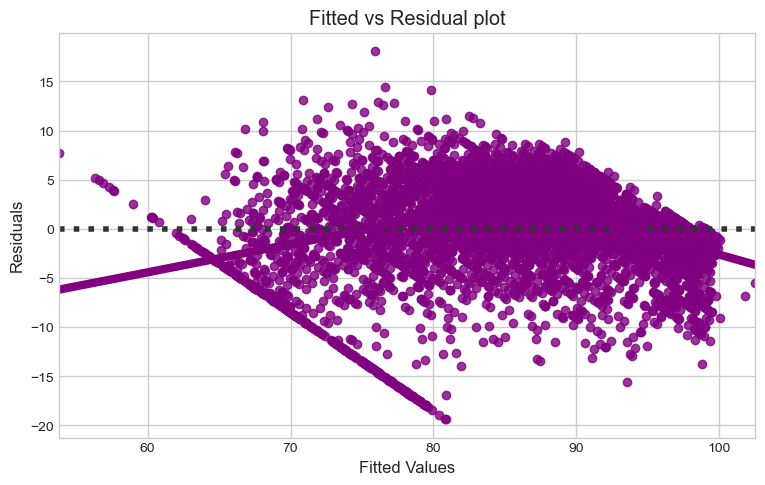

In [566]:
# let us plot the fitted values vs residuals

sns.set_style("whitegrid")
sns.residplot(
    data=df_pred_model, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

In [567]:
X_train_new = X_train.copy()

In [568]:
# using square transformation

X_train_new["pflt_square"] = np.square(X_train_new["pflt"])
X_train_new["freeswap_square"] = np.square(X_train_new["freeswap"])

In [569]:
# let's create a model with the transformed data
olsmod_29 = sm.OLS(Y_train, X_train_new)
olsres_29 = olsmod_29.fit()
print(olsres_29.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.885
Model:                            OLS   Adj. R-squared:                  0.884
Method:                 Least Squares   F-statistic:                     4876.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:50:58   Log-Likelihood:                -15025.
No. Observations:                5734   AIC:                         3.007e+04
Df Residuals:                    5724   BIC:                         3.014e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   72.4760 

**We can observe that the adj. R-squared has increased. Let's check the residual plot again.**

In [570]:
# let us recreate the dataframe with actual, fitted and residual values
df_pred_model1 = pd.DataFrame()

df_pred_model1["Actual Values"] = Y_train.values.flatten()  # actual values
df_pred_model1["Fitted Values"] = olsres_29.fittedvalues.values  # predicted values
df_pred_model1["Residuals"] = olsres_29.resid.values  # residuals

df_pred_model1.head()

,Actual Values,Fitted Values,Residuals
0,91.0,94.102127,-3.102127
1,94.0,94.371835,-0.371835
2,61.5,61.494914,0.005086
3,83.0,82.364936,0.635064
4,94.0,96.844073,-2.844073


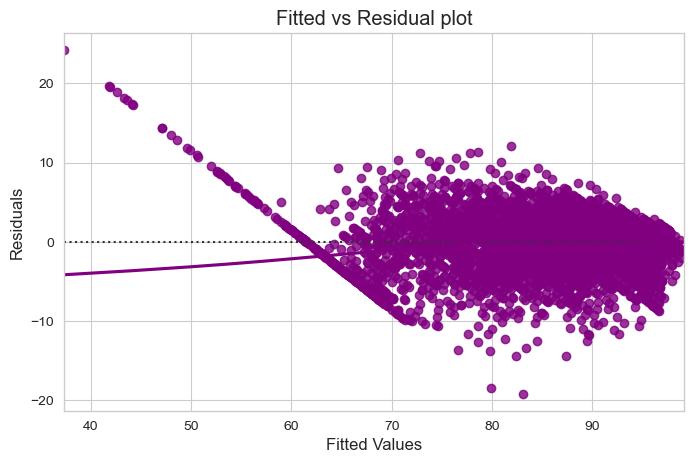

In [119]:
# let us plot the fitted values vs residuals
sns.set_style("whitegrid")
sns.residplot(
    data=df_pred_model1, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

**We can observe that the pattern has slightly decreased and the data points seems to be randomly distributed.**

**Assumptions of Linear Regression**

These assumptions are essential conditions that should be met before we draw inferences regarding the model estimates or use the model to make a prediction.

For Linear Regression, we need to check if the following assumptions hold:-

 * Linearity
 * Independence
 * Homoscedasticity
 * Normality of error terms
 * No strong Multicollinearity

**1. TEST FOR LINEARITY AND INDEPENDENCE**

**Why the test?**
* Linearity describes a straight-line relationship between two variables, predictor variables must have a linear relation with the dependent variable.

**How to check linearity?**

* Make a plot of fitted values vs residuals. If they don't follow any pattern (the curve is a straight line), then we say the model is linear otherwise model is showing signs of non-linearity.

**How to fix if this assumption is not followed?**

* We can try different transformations.

**We can observe a pattern in the residual vs fitted values, hence we will try to transform the continous variables in the data.**

In [120]:
# columns in training set

X_train.columns

Index(['const', 'lread', 'scall', 'pgin', 'pflt', 'freemem', 'freeswap',
       'runqsz_Not_CPU_Bound'],
      dtype='object')

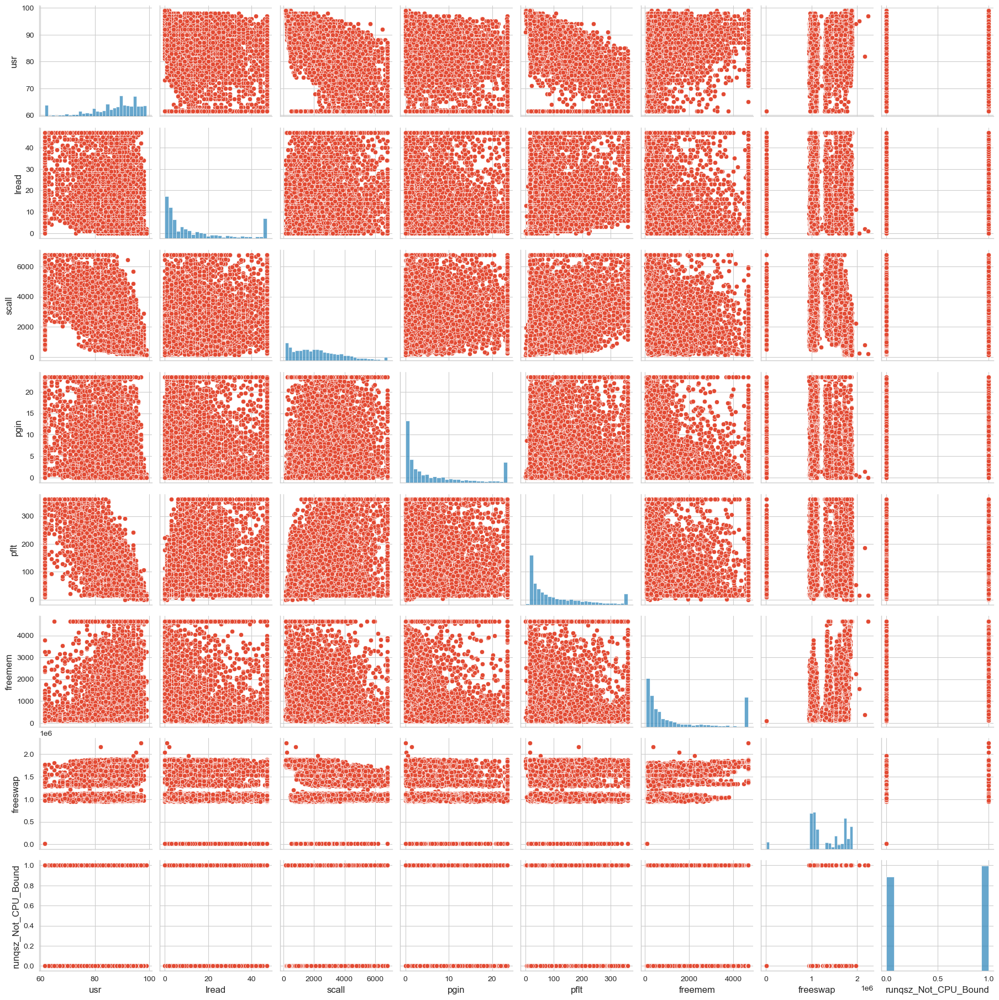

In [121]:
# checking the distribution of variables in training set with dependent variable

#fig_dims = (12, 6)
sns.pairplot(df_comp[['usr', 'lread', 'scall', 'pgin', 'pflt', 'freemem',
       'freeswap', 'runqsz_Not_CPU_Bound']], height = 2.3)
plt.show()

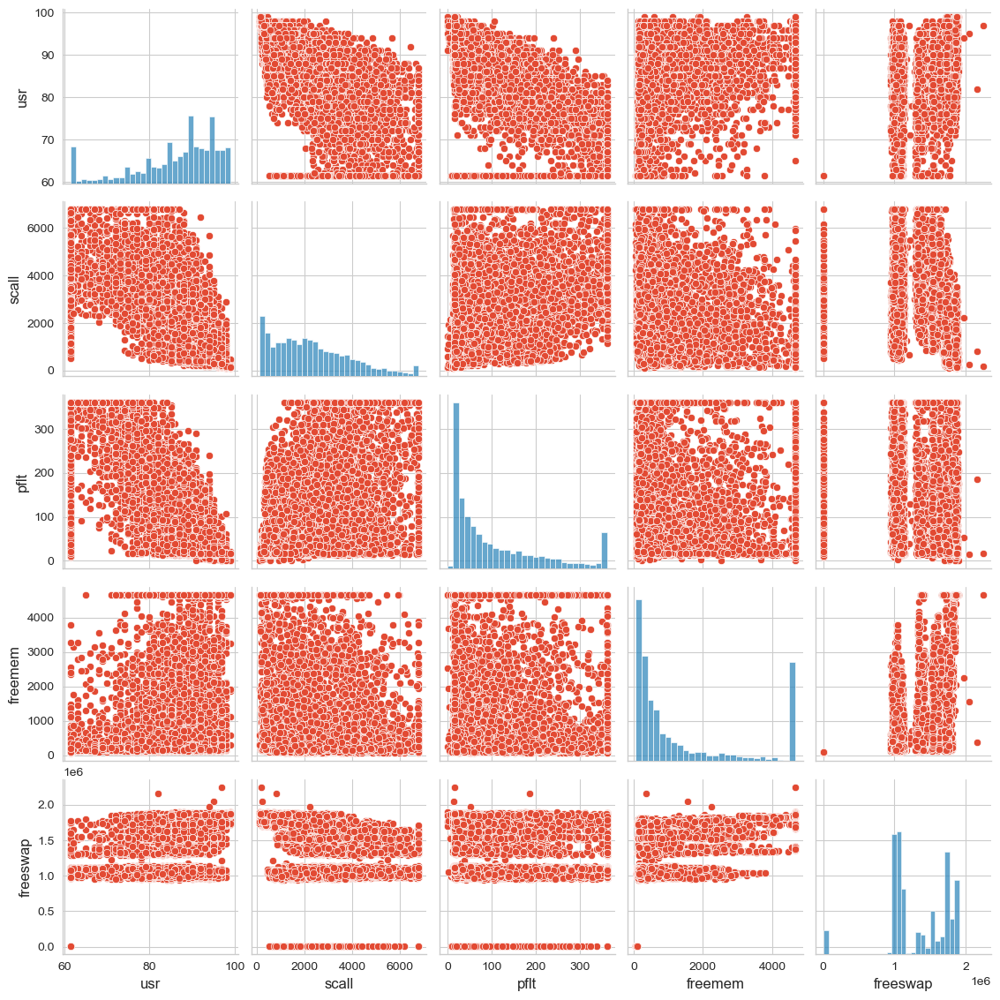

In [122]:
sns.pairplot(df_comp[['usr',  'scall', 'pflt', 'freemem',
       'freeswap', ]], height = 2.3)
plt.show()

### TEST FOR NORMALITY

**What is the test?**

* Error terms/residuals should be normally distributed.

* If the error terms are not normally distributed, confidence intervals may become too wide or narrow. Once confidence interval becomes unstable, it leads to difficulty in estimating coefficients based on minimization of least squares.

**What does non-normality indicate?**

* It suggests that there are a few unusual data points which must be studied closely to make a better model.

**How to check the Normality?**

* It can be checked via QQ Plot - residuals following normal distribution will make a straight line plot, otherwise not.

* Another test to check for normality is the Shapiro-Wilk test.

**How to Make residuals normal?**

* We can apply transformations like log, exponential, arcsinh, etc as per our data.

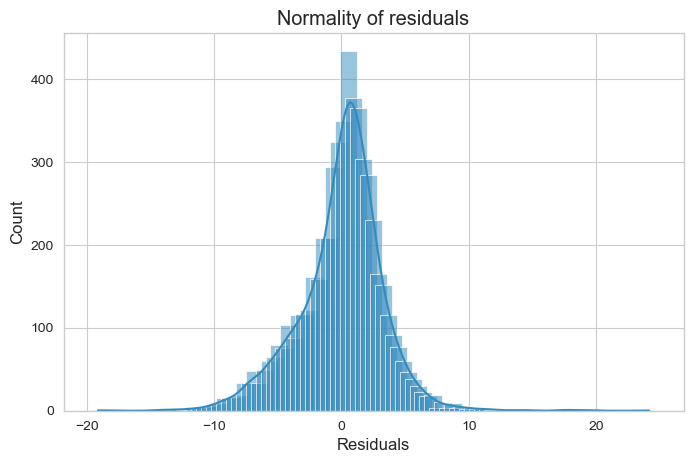

In [123]:
fig_dims = (12, 6)
sns.histplot(df_pred_model1["Residuals"], kde=True, shrink = 3.5 )
plt.title("Normality of residuals")
plt.show()

**The residual values are normally distributed.**

**The QQ plot of residuals can be used to visually check the normality assumption. The normal probability plot of residuals should approximately follow a straight line.**

In [124]:
import pylab
import scipy.stats as stats

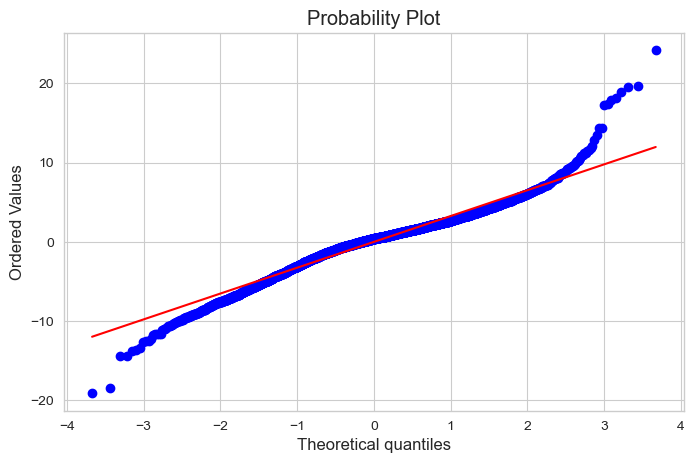

In [125]:
stats.probplot(df_pred_model1["Residuals"], dist="norm", plot=pylab)
plt.show()

**Most of the points are lying on the straight line in QQ plot**

The Shapiro-Wilk test can also be used for checking the normality. The null and alternate hypotheses of the test are as follows:

* Null hypothesis - Data is normally distributed.
* Alternate hypothesis - Data is not normally distributed.

In [126]:
stats.shapiro(df_pred_model1["Residuals"])

ShapiroResult(statistic=0.9619279503822327, pvalue=2.3508701405841054e-36)

* Since p-value < 0.05, the residuals are not normal as per shapiro test.
* Strictly speaking - the residuals are not normal. However, as an approximation, we might be willing to accept this distribution as close to being normal

### TEST FOR HOMOSCEDASTICITY

* **Homoscedacity** - If the variance of the residuals are symmetrically distributed across the regression line , then the data is said to homoscedastic.

* **Heteroscedacity** - If the variance is unequal for the residuals across the regression line, then the data is said to be heteroscedastic. In this case the residuals can form an arrow shape or any other non symmetrical shape.

**Why the test?** 

* The presence of non-constant variance in the error terms results in heteroscedasticity. Generally, non-constant variance arises in presence of outliers.

**How to check if model has Heteroscedasticity?**

* Can use the goldfeldquandt test. If we get p-value > 0.05 we can say that the residuals are homoscedastic, otherwise they are heteroscedastic.

**How to deal with Heteroscedasticity?**

* Can be fixed via adding other important features or making transformations.

The null and alternate hypotheses of the goldfeldquandt test are as follows:

* Null hypothesis : Residuals are homoscedastic
* Alternate hypothesis : Residuals have hetroscedasticity

In [127]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

In [128]:
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(df_pred_model1["Residuals"], X_train_new)
lzip(name, test)

[('F statistic', 1.02258561554032), ('p-value', 0.27530813579526286)]

**Since p-value > 0.05 we can say that the residuals are homoscedastic.**

**All the assumptions of linear regression are now satisfied. Let's check the summary of our final model (olsres_2).**

In [571]:
print(olsres_29.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.885
Model:                            OLS   Adj. R-squared:                  0.884
Method:                 Least Squares   F-statistic:                     4876.
Date:                Sun, 04 Dec 2022   Prob (F-statistic):               0.00
Time:                        18:51:18   Log-Likelihood:                -15025.
No. Observations:                5734   AIC:                         3.007e+04
Df Residuals:                    5724   BIC:                         3.014e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   72.4760 

### Observations

* R-squared of the model is 0.885 and adjusted R-squared is 0.884, which shows that the model is able to explain ~88% variance in the data. This is quite good.

* A unit increase in the "lread" will result in a 0.0430 unit decrease in the portion of time that cpu run in user mode.

* A unit increase in the "pflt" (i.e) ( Number of page faults caused by protection errors (copy on writes)) will result in a 0.0336 unit decrease in the portion of time that cpu run in user mode.

* The "runqsz" i.e (Process run queue size) when CPU is not Bound is 0.3615 times higher than CPU is Bound, all other variables remaining constant.

## Predictions

**Let's print the linear regression equation.**

In [130]:
# let's check the model parameters
olsres_29.params

const                   7.247598e+01
lread                  -4.300244e-02
scall                  -1.949265e-03
pgin                   -2.239323e-01
pflt                   -3.358220e-02
freemem                 6.223506e-04
freeswap                3.795233e-05
runqsz_Not_CPU_Bound    3.614689e-01
pflt_square            -3.961932e-05
freeswap_square        -1.382577e-11
dtype: float64

In [131]:
# Let us write the equation of linear regression
Equation = "usr ="
print(Equation, end=" ")
for i in range(len(X_train_new.columns)):
    if i == 0:
        print(olsres_29.params[i], "+", end=" ")
    elif i != len(X_train_new.columns) - 1:
        print(
            olsres_29.params[i],
            "* (",
            X_train_new.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(olsres_29.params[i], "* (", X_train_new.columns[i], ")")

usr = 72.47598461801532 + -0.04300244073558113 * ( lread ) +  -0.0019492651796473824 * ( scall ) +  -0.22393229925660912 * ( pgin ) +  -0.033582195535752514 * ( pflt ) +  0.0006223506493139882 * ( freemem ) +  3.795232759722595e-05 * ( freeswap ) +  0.36146894569866256 * ( runqsz_Not_CPU_Bound ) +  -3.961932332225032e-05 * ( pflt_square ) +  -1.3825770817955602e-11 * ( freeswap_square )


### We can now use the model for making predictions on the test data.

In [132]:
X_train_new.columns

Index(['const', 'lread', 'scall', 'pgin', 'pflt', 'freemem', 'freeswap',
       'runqsz_Not_CPU_Bound', 'pflt_square', 'freeswap_square'],
      dtype='object')

In [572]:
X_test.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [573]:
# dropping columns from the test data that are not there in the training data
X_test_new = X_test.drop(["lwrite",'sread', 'swrite', 'fork', 'exec', 'pgout', 'ppgout', 
                       'pgfree', 'atch', 'ppgin','vflt','rchar','wchar'], axis=1)


In [574]:
# transforming the pflt and freeswap columns in the test data corresponding to the training set

X_test_new["pflt_square"] = np.square(X_test_new["pflt"])
X_test_new["freeswap_square"] = np.square(X_test_new["freeswap"])

In [575]:
X_test_new.head()

,const,lread,scall,pgin,pflt,freemem,freeswap,runqsz_Not_CPU_Bound,pflt_square,freeswap_square
3894,1.0,27.0,1252.0,0.4,19.44,4659.125,1875466.0,1,377.9136,3.517373e+12
4276,1.0,1.0,996.0,1.0,35.53,2979.000,1010114.0,1,1262.3809,1.020330e+12
3414,1.0,9.0,1530.0,14.8,26.80,89.000,10989.5,0,718.2400,1.207691e+08
4165,1.0,32.0,3243.0,4.6,250.60,1300.000,1535309.0,0,62800.3600,2.357174e+12
7385,1.0,16.0,5017.0,5.6,142.80,2114.000,988600.0,0,20391.8400,9.773300e+11


In [577]:
# let's make predictions on the test set
y_pred = olsres_29.predict(X_test_new)


**Model Evaluation**

In [578]:
# let's check the MAE on the train data
mae1 = mean_absolute_error(Y_train, df_pred_model1["Fitted Values"])
print("The MAE value on Train Data using Model 29 is ",mae1 )

The MAE value on Train Data using Model 29 is  2.4381615207492864


In [579]:
# let's check the MAE on the test data
mae2 = mean_absolute_error(Y_test, y_pred)
print("The MAE value on Test Data using Model 29 is ",mae2 )

The MAE value on Test Data using Model 29 is  2.467858736358335


In [580]:
# let's check the RMSE on the train data
rmse1 = np.sqrt(mean_squared_error(Y_train, df_pred_model1["Fitted Values"]))
print("The RMSE value on Train Data using Model 29 is ",rmse1 )

The RMSE value on Train Data using Model 29 is  3.3247390272144015


In [581]:
# let's check the RMSE on the test data
rmse2 = np.sqrt(mean_squared_error(Y_test, y_pred))
print("The RMSE value on Test Data using Model 29 is ",rmse2 )

The RMSE value on Test Data using Model 29 is  3.37804296280445


In [582]:
# r2 score
print("The R2 score of the Model 29 is ",r2_score(Y_test, y_pred))

The R2 score of the Model 29 is  0.8775425087854933


In [583]:
#Explained variance score

print("The Explained variance score of Model 29 is ",metrics.explained_variance_score(Y_test, y_pred))

The Explained variance score of Model 29 is  0.8776031382290441


* We can see that RMSE on the train and test sets are comparable. So, our model is not suffering from overfitting.
* MAE indicates that our current model is able to predict "usr" within a mean error of 2.4 units on the test data.
* Hence, we can conclude the model "ols_res29" is good for prediction as well as inference purposes.

**Reason for Choosing MODEL 29 as Best Model**

*	The Assumptions of Linear Regression is satisfied.
*	We can see that MAE, RMSE on the train and test sets are comparable. So, our model is not suffering from over fitting.
*	MAE indicates that our current model is able to predict "usr" within a mean error of 2.4 units on the test data.
*	R2 score and Explained variance score is above 80% which showcase that the Model is Best for Predicting the data.
*	A low MSE value and a high Explained variance score suggest that the model is a Best model.
*	R square and Adjusted R square Values: The Model 29 shows 88% variance in the data.
*	From the Linear Regression Equation, we are able to predict the “usr” variable based on the independent variable coefficients.
*	The comparability of these values suggests that MODEL 29 "ols_res29" is unbiased and hence a good fit for prediction as well as inference purposes.


### 1.4	Inference: Basis on these predictions, what are the business insights and recommendations. Please explain and summarise the various steps performed in this project. There should be proper business interpretation and actionable insights present.

**Summary of Learnings**

In the Comp-active databases is a collection of a computer systems activity measures Problem, the following were learned

1.	Data has been loaded correctly into the pandas dataframe
2.	There are 8192 rows and 22 features with 1 object datatypes and 21 int datatypes.
3.	The missing value treatment for two features 'rchar', 'wchar' was done using median filler.
4.	There were 13 columns have values equal to 0. Among them,'pgscan' has around 6448 values are 0. Hence that feature was dropped.
5.	The outlier’s were detected and treated using IQR method. This had an effect on quality of Models built.
6.	Univariate, Bivariate, Multivariate Analysis of dataset was done.
7.	One Hot Encoding for categorical Feature “runqsz” was done. 
8.	The Predictor variables was copied into “X” dataframe and the Target variable was copied into “y” dataframe.
9.	The data was split into Train and Test set at 70:30 ratio.
10.	Linear Regression Model using Scikit were performed for all the Train data.
11.	Coefficient, Accuracy, intercept, mse, rmse of the model checked.
12.	VIF of the feature were done to check on multicollinearity.
13.	Using “statsmodel”, the R square and Adjusted R square value calculated for OLS models.
14.	Various models built based on the VIF values, R square and Adjusted R square values.
15.	Features with high VIF values were dropped. At the end there were only 7 features remained.
16.	Square Transformation performed to transform data. This increased the R square and Adjusted R square values to 0.885 and 0.884.
17.	Residual Plot using Fitted and Actual values done.
18.	Assumption of Linear Regression satisfied.
	 Linearity
	Independence
	Homoscedasticity
	Normality of error terms
	No strong Multicollinearity
19.	Model Evaluation was done based on the following.
	MAE
	R 2 score
	RMSE
	Explained variance

20.	After comparison of all models, MODEL 29 (olsres_29) was chosen as the Best Optimal Model in predicting the Target variable “usr”.
21.	Attributes that contribute for (%) of time that CPU run in user mode and their significance were learned.

**Further Insights**

*	R-squared of the model is 0.885 and adjusted R-squared is 0.884, which shows that the model is able to explain ~88% variance in the data. This is quite good model.
*	A unit increase in the "lread" (i.e) read transfers per second between system memory and user memory will result in a 0.0430 unit decrease in the portion of time that CPU run in user mode. 
*	A unit increase in the number of system calls (“scall”) will decrease 0.00194 times the portion of time that CPU run in user mode. 
*	A unit increase in the number of page in requests per second “pgin” will decrease 0.2239 times the portion of time that CPU run in user mode. This is most significant decrease.
*	A unit increase in the "pflt" (i.e) Number of page faults caused by protection errors (copy on writes) will result in a 0.0336 unit decrease in the portion of time that CPU run in user mode.
*	A unit increase in the "fremem" (i.e) Number of memory pages available to user processes will result in a 0.00062 unit increase in the portion of time that CPU run in user mode.
*	“freeswap” coefficient is very negligible. Hence can be neglected.
*	When “runqsz_Not_CPU_Bound” value is “1” then, the “usr” value increases by 0.3614 times. Hence when CPU is not bound then Portion of time that CPU run in user mode increases.

 
**Conclusion & Recommendation**

1.	Increasing the MB of Memory from 128 MB to 8GB is required for a machine running in a multi-user university department.
2.	Reducing number of system calls and Number of Page request can increase the portion of time CPU run in User mode.
3.	CPU time (or process time) is the amount of time for which a central processing unit (CPU) was used for processing instructions of a computer program. 
4.	Modern CPUs handle multitasking situations by splitting processes between multiple processor cores, which work through different sets of instructions simultaneously.
5.	Clearing RAM space, gives the computer the capability to carry out tasks.
6.	Increasing “freemem” can increase CPU in user mode.
7.	Increasing the physical RAM on the machine can result in fewer page faults. Hence page fault in the CPU decreases which can increase the % of time CPU in User mode.
8.	Deleting Cache can take give more space because it uses RAM for memory.
9.	Secure computing can be used to reduce the number of entry points into the kernel space, thereby reducing the kernel attack surface. Thereby it reduces and optimizes the number of system calls generated.

**Thus the above suggestion can increase the efficiency of the CPU time and able to perform multitasking by consuming minimal memory in a Multi User University Department**


# Problem 2: Logistic Regression, LDA and CART

You are a statistician at the Republic of Indonesia Ministry of Health and you are provided with a data of 1473 females collected from a Contraceptive Prevalence Survey. The samples are married women who were either not pregnant or do not know if they were at the time of the survey.

The problem is to predict do/don't they use a contraceptive method of choice based on their demographic and socio-economic characteristics.

**Data Dictionary:**

1. Wife's age (numerical)
2. Wife's education (categorical) 1=uneducated, 2, 3, 4=tertiary
3. Husband's education (categorical) 1=uneducated, 2, 3, 4=tertiary
4. Number of children ever born (numerical)
5. Wife's religion (binary) Non-Scientology, Scientology
6. Wife's now working? (binary) Yes, No
7. Husband's occupation (categorical) 1, 2, 3, 4(random)
8. Standard-of-living index (categorical) 1=verlow, 2, 3, 4=high
9. Media exposure (binary) Good, Not good
10. Contraceptive method used (class attribute) No,Yes

### 2.1 Data Ingestion: Read the dataset. Do the descriptive statistics and do null value condition check, check for duplicates and outliers and write an inference on it. Perform Univariate and Bivariate Analysis and Multivariate Analysis.

**Load and explore the data**

In [420]:
df_contraceptive = pd.read_excel("Contraceptive_method_dataset.xlsx")

In [421]:
df_contraceptive.head().T

,0,1,2,3,4
Wife_age,24.0,45.0,43.0,42.0,36.0
Wife_ education,Primary,Uneducated,Primary,Secondary,Secondary
Husband_education,Secondary,Secondary,Secondary,Primary,Secondary
No_of_children_born,3.0,10.0,7.0,9.0,8.0
Wife_religion,Scientology,Scientology,Scientology,Scientology,Scientology
Wife_Working,No,No,No,No,No
Husband_Occupation,2,3,3,3,3
Standard_of_living_index,High,Very High,Very High,High,Low
Media_exposure,Exposed,Exposed,Exposed,Exposed,Exposed
Contraceptive_method_used,No,No,No,No,No


In [422]:
df_contraceptive.tail().T

,1468,1469,1470,1471,1472
Wife_age,33.0,33.0,39.0,33.0,17.0
Wife_ education,Tertiary,Tertiary,Secondary,Secondary,Secondary
Husband_education,Tertiary,Tertiary,Secondary,Secondary,Secondary
No_of_children_born,NaN,NaN,NaN,NaN,1.0
Wife_religion,Scientology,Scientology,Scientology,Scientology,Scientology
Wife_Working,Yes,No,Yes,Yes,No
Husband_Occupation,2,1,1,2,2
Standard_of_living_index,Very High,Very High,Very High,Low,Very High
Media_exposure,Exposed,Exposed,Exposed,Exposed,Exposed
Contraceptive_method_used,Yes,Yes,Yes,Yes,Yes


In [423]:
df_contraceptive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [424]:
# shape of dataset

print("no. of rows: ",df_contraceptive.shape[0], "\n""no. of columns: ",df_contraceptive.shape[1])

no. of rows:  1473 
no. of columns:  10


In [425]:
df_contraceptive.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Wife_age,1402.0,NaN,NaN,NaN,32.606277,8.274927,16.0,26.0,32.0,39.0,49.0
Wife_ education,1473,4,Tertiary,577,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_education,1473,4,Tertiary,899,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_of_children_born,1452.0,NaN,NaN,NaN,3.254132,2.365212,0.0,1.0,3.0,4.0,16.0
Wife_religion,1473,2,Scientology,1253,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Wife_Working,1473,2,No,1104,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Husband_Occupation,1473.0,NaN,NaN,NaN,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0
Standard_of_living_index,1473,4,Very High,684,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Media_exposure,1473,2,Exposed,1364,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contraceptive_method_used,1473,2,Yes,844,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The "Wife_age" and "No_of_children_born" columns has few Null values which needs to be treated.

**Observation:**

 * Data has been loaded correctly into the pandas dataframe

 * There are 1473 rows and 10 features

 * There are missing values in "Wife_age" and "No_of_children_born" columns

 * There are two float64 datatype columns, one int64 and 7 object datatype columns.

 * The target variable "contraceptive_method_used" is object datatype.

**Checking for NULL data**

In [426]:
df_contraceptive.isnull().sum()

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

There are NULL values in "Wife_age" and "No_of_children_born" columns

**Null Value Treatment**

Now let us impute the Null values with the median value

In [427]:
df_contraceptive.median()

Wife_age               32.0
No_of_children_born     3.0
Husband_Occupation      2.0
dtype: float64

In [428]:
# Rreplacing the missing values with median values of the columns.

for column in df_contraceptive.columns:
    if df_contraceptive[column].dtype != 'object':
        median = df_contraceptive[column].median()
        df_contraceptive[column] = df_contraceptive[column].fillna(median)

In [429]:
# checking for null values

df_contraceptive.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

We can see that all Null values are imputed.

**Checking for duplicate data**

In [430]:
dups = df_contraceptive.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))


Number of duplicate rows = 85


**There are 85 duplicated rows in the dataset**

In [431]:
# The duplicates are dropped using the below command

df_contraceptive.drop_duplicates(inplace=True)

In [432]:
dups = df_contraceptive.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


In [433]:
df_contraceptive.shape

(1388, 10)

**The number of rows are 1388 and columns are 10**

**Checking for Outliers**

**Constructing box plot for continuous variables**



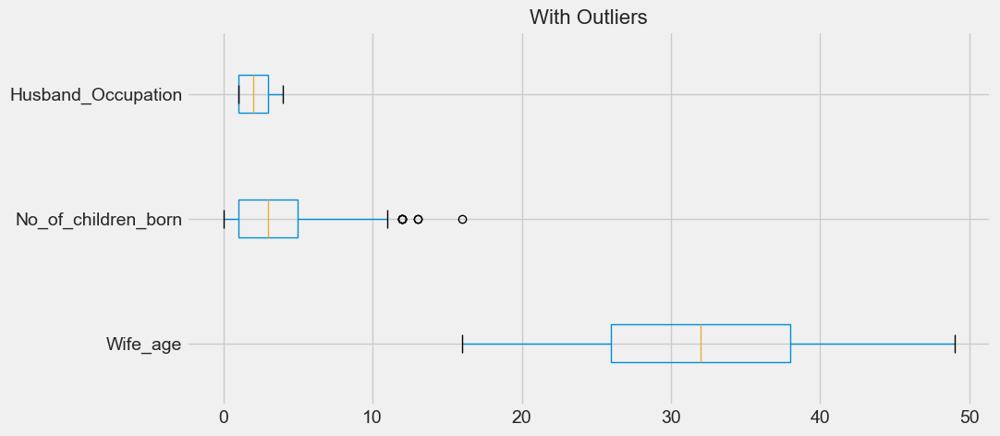

In [434]:
cont=df_contraceptive.dtypes[(df_contraceptive.dtypes!='object')].index
plt.figure(figsize=(10,5))
df_contraceptive[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

We can see that "No_of_children_born" column has some outliers

**Treating the outliers.**

* We can treat Outliers with the following code. We will treat the outliers for the 'No_of_children_born' variable only.

In [435]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [436]:
lr,ur=remove_outlier(df_contraceptive['No_of_children_born'])
print('Lower Range :',lr,'\nUpper Range :',ur)
df_contraceptive['No_of_children_born']=np.where(df_contraceptive['No_of_children_born']>ur,ur,df_contraceptive['No_of_children_born'])
df_contraceptive['No_of_children_born']=np.where(df_contraceptive['No_of_children_born']<lr,lr,df_contraceptive['No_of_children_born'])

Lower Range : -5.0 
Upper Range : 11.0


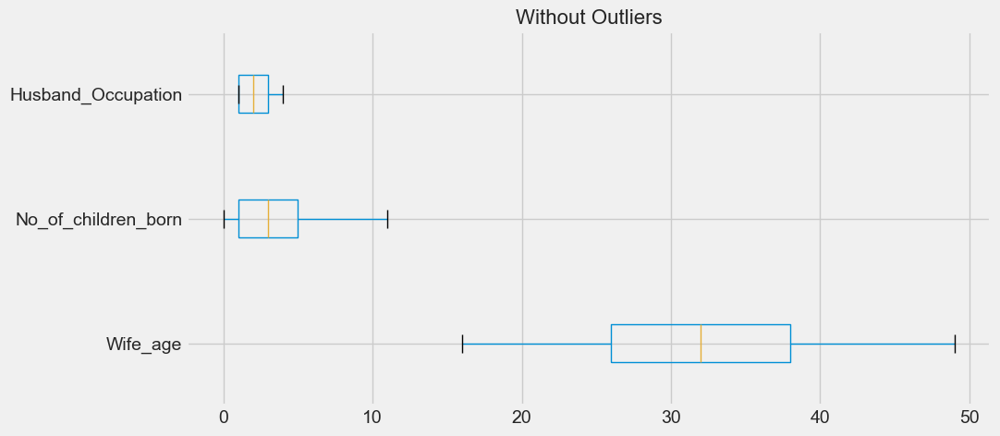

In [437]:
cont=df_contraceptive.dtypes[(df_contraceptive.dtypes!='object')].index
plt.figure(figsize=(10,5))
df_contraceptive[cont].boxplot(vert=0)
plt.title('Without Outliers',fontsize=16)
plt.show()

We can observe that there are no outliers for any columns.

### Univariate Analysis

**a) For Numeric Variables**

In [438]:
df_contraceptive_num = df_contraceptive.select_dtypes(include = ['float64', 'int64'])
numeric_columns = list(df_contraceptive_num.columns.values)
print("The number of Numeric columns in the dataset is: ",len(numeric_columns))

The number of Numeric columns in the dataset is:  3


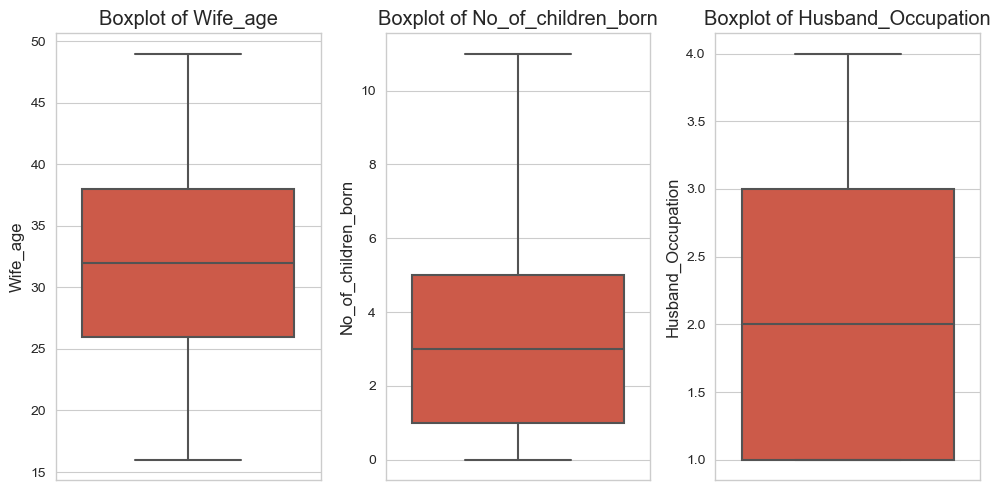

In [164]:
# using boxplots on numeric columns

plt.figure(figsize = (10,5))
feature_list = df_contraceptive_num.columns
for i in range(len(feature_list)):
    plt.subplot(1, 3 ,i +1)
    sns.boxplot(y = df_contraceptive[feature_list[i]], data = df_contraceptive)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

**Insights**

 * There are 3 numeric fields in the data

 * No outliers present

 * Average age of a married women surveyed is between 30-35 years.
 
 * number of children for every married women falls between 2-3.

**Distribution Plot for Contraceptive Dataset**

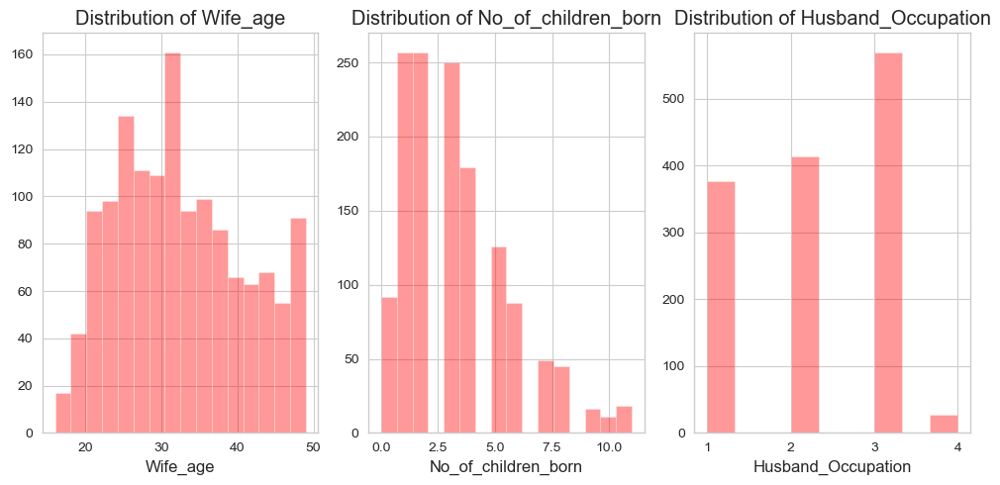

In [165]:
# using histplot on numeric columns

plt.figure(figsize = (10,5))
feature_list = df_contraceptive_num.columns
for i in range(len(feature_list)):
    plt.subplot(1, 3 ,i +1)
    sns.distplot(df_contraceptive_num[feature_list[i]], kde=False, color='r');
    plt.title('Distribution of {}'.format(feature_list[i]))
    plt.tight_layout()

**Insights**

1. Wife Age between 30 - 35 yrs is highest
2. No_of_children_born is highest for values in range 1-2.
3. Husband Occupation 3 is highest.

**b) For Categorical Variables**

### unique values for categorical variables


In [166]:
for column in df_contraceptive.columns:
    if df_contraceptive[column].dtype == 'object':
        print(column.upper(),': ',df_contraceptive[column].nunique())
        print(df_contraceptive[column].value_counts().sort_values())
        print('\n')

WIFE_ EDUCATION :  4
Uneducated    150
Primary       330
Secondary     398
Tertiary      510
Name: Wife_ education, dtype: int64


HUSBAND_EDUCATION :  4
Uneducated     44
Primary       175
Secondary     347
Tertiary      822
Name: Husband_education, dtype: int64


WIFE_RELIGION :  2
Non-Scientology     206
Scientology        1182
Name: Wife_religion, dtype: int64


WIFE_WORKING :  2
Yes     348
No     1040
Name: Wife_Working, dtype: int64


STANDARD_OF_LIVING_INDEX :  4
Very Low     129
Low          227
High         419
Very High    613
Name: Standard_of_living_index, dtype: int64


MEDIA_EXPOSURE  :  2
Not-Exposed     109
Exposed        1279
Name: Media_exposure , dtype: int64


CONTRACEPTIVE_METHOD_USED :  2
No     614
Yes    774
Name: Contraceptive_method_used, dtype: int64




In [167]:
df_cat = df_contraceptive.select_dtypes(include = ['object'])
lstcatcolumns = list(df_cat.columns.values)
lstcatcolumns

['Wife_ education',
 'Husband_education',
 'Wife_religion',
 'Wife_Working',
 'Standard_of_living_index',
 'Media_exposure ',
 'Contraceptive_method_used']

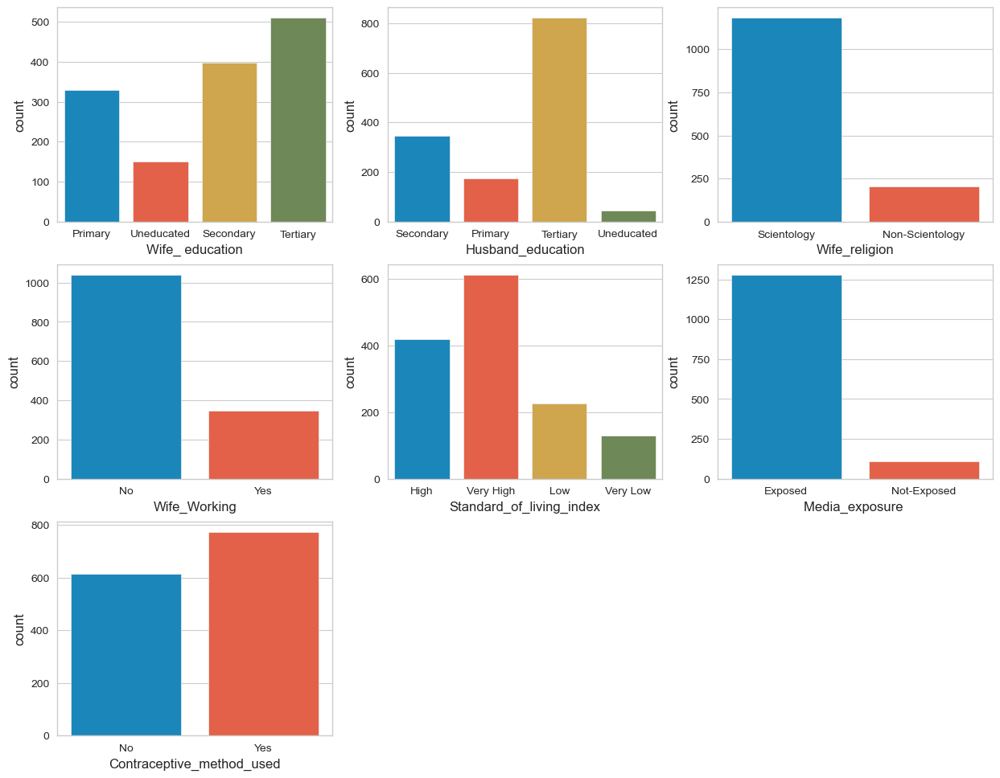

In [168]:
# count plots for categorical features as subplots - 3 rows and 2 cols
fig, axes = plt.subplots(nrows=3,ncols=3)
fig.set_size_inches(15,12)
plt.style.use('fivethirtyeight')

sns.countplot(df_contraceptive['Wife_ education'], data = df_contraceptive, ax=axes[0][0])
sns.countplot(df_contraceptive['Husband_education'], data = df_contraceptive, ax=axes[0][1])
sns.countplot(df_contraceptive['Wife_religion'], data = df_contraceptive, ax=axes[0][2])
sns.countplot(df_contraceptive['Wife_Working'], data = df_contraceptive, ax=axes[1][0])
sns.countplot(df_contraceptive['Standard_of_living_index'], data = df_contraceptive, ax=axes[1][1])
sns.countplot(df_contraceptive['Media_exposure '], data = df_contraceptive, ax=axes[1][2])
sns.countplot(df_contraceptive['Contraceptive_method_used'], data = df_contraceptive, ax=axes[2][0]);
fig.delaxes(axes[2][1])
fig.delaxes(axes[2][2])

**Insights**

1) "Wife_ education" for Tertiary is highest which denotes majority of Women who is married is Graduated.

2) "Husband_education" or Tertiary is highest which denotes majority of Men are Graduated.

3) Most of "Wife_Religion" is Scientology.

4) There are many Non-working Married Women.

5) "Standard_of_living_index" is Very High for these Women.

6) Most of the Women are Media Exposed.

7) Majority of the Females use Contraceptives.

### Bivariate Analysis

**Numeric vs Numeric**

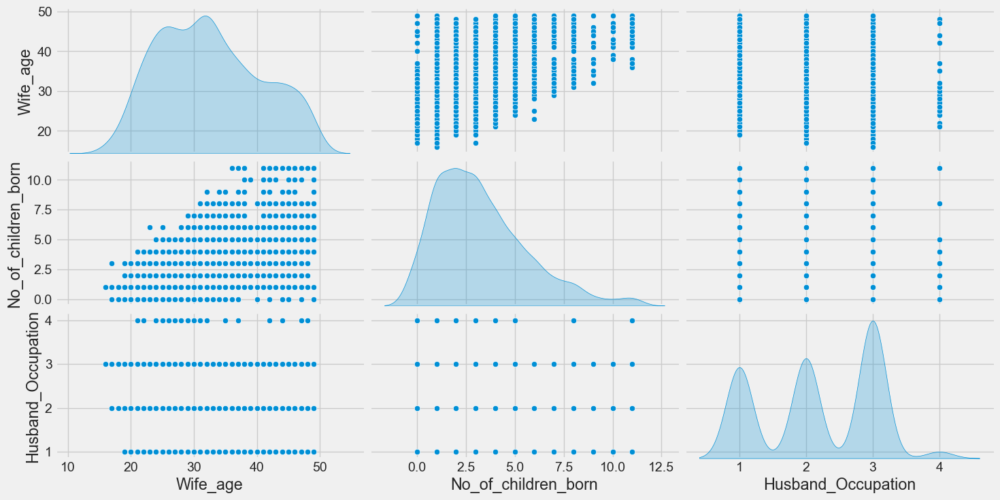

In [229]:
sns.pairplot(df_contraceptive_num, height = 2.5, aspect = 2 , diag_kind = 'kde');
plt.show()

We can observe that there is no pattern or multicollinearity between the independent numeric variables

**Checking for Correlations**

In [170]:
df_contraceptive_num.corr()

,Wife_age,No_of_children_born,Husband_Occupation
Wife_age,1.000000,0.530196,-0.188114
No_of_children_born,0.530196,1.000000,-0.022172
Husband_Occupation,-0.188114,-0.022172,1.000000


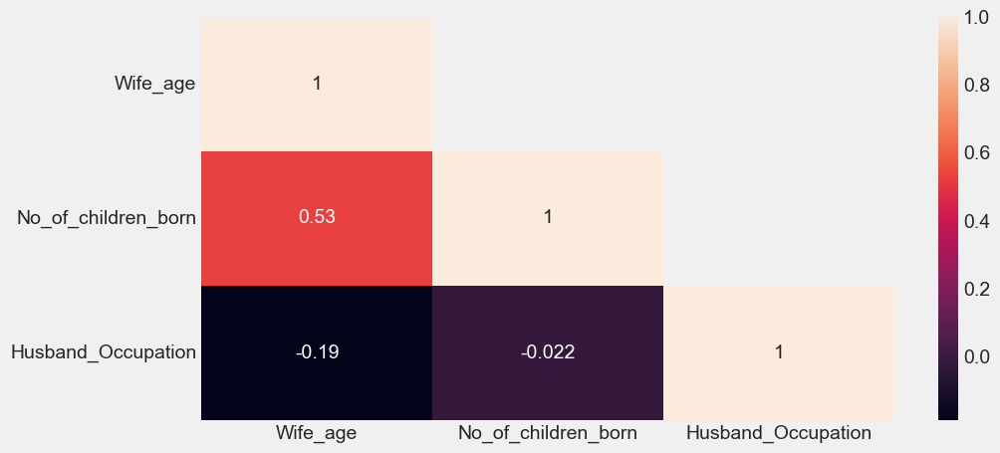

In [171]:
plt.figure(figsize=(10,5))
sns.heatmap(df_contraceptive_num.corr(), annot=True,mask=np.triu(df_contraceptive_num.corr(),+1));

There is no strong correlation among the Numeric Independent Datatype.

**Categorical vs Categorical**

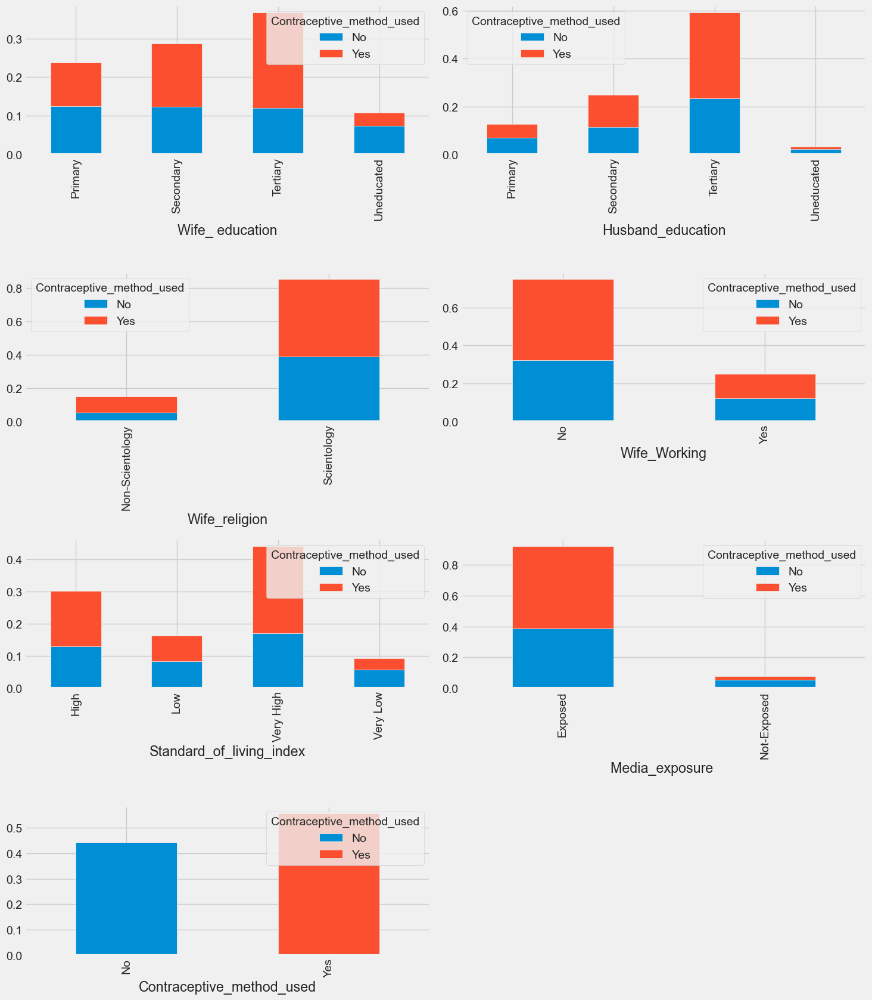

In [172]:
# between the categorical target feature and the independent target features - suplots - 3 rows and 2 cols
# 100% stacked bar chart

fig,ax = plt.subplots(4,2, figsize=(15,17))
plt.legend(['contraceptive used'], loc = 'center')  
for i, cols in enumerate(df_cat):
    tab = pd.crosstab(df_contraceptive[cols],df_contraceptive['Contraceptive_method_used'], normalize = True)
    tab.plot(kind='bar',stacked=True,ax=ax[i//2,i%2])
plt.tight_layout()
fig.delaxes(ax[3][1])

**Insights**

•	Contraceptive_method_used by Tertiary educated Women is highest.

•	Similarly Females whose Husband Education is Tertiary use more Contraceptives.

•	Female Scientologist use more Contraceptives than non- Scientologist.

•	Working Women and Women who are not working use Contraceptives. Hence both the categories on an average use Contraceptives.

•	Women living a Very High Standard_of_living use more Contraceptives

•	Females who are exposed to Media use more Contraceptives.


In [173]:
## Categorical vs Numeric

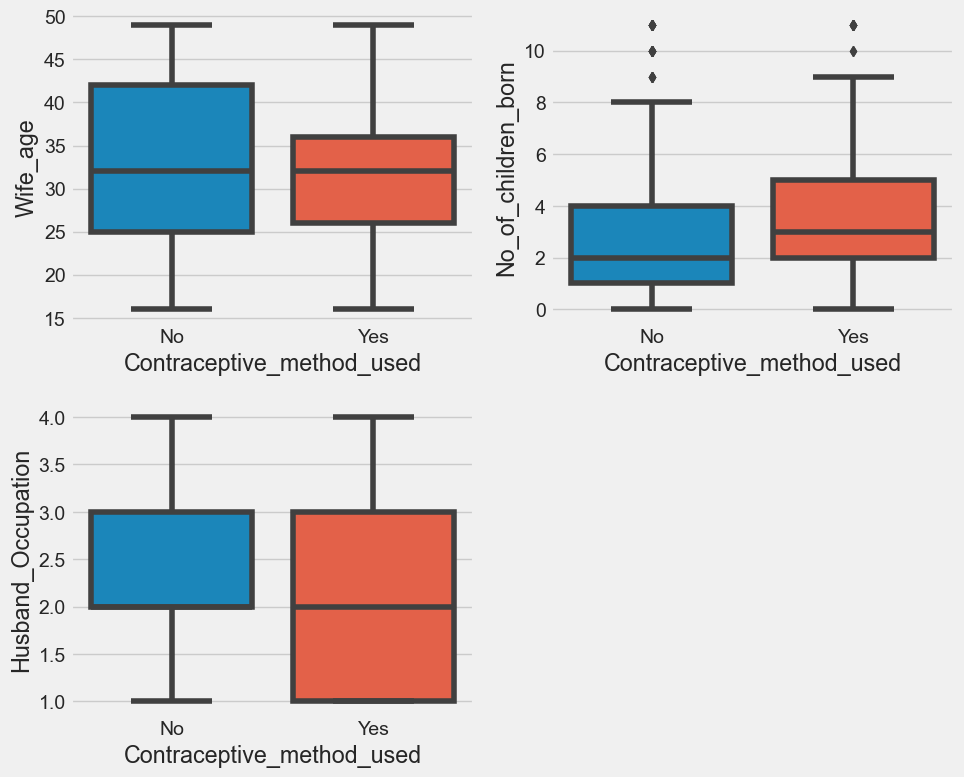

In [174]:

fig,ax = plt.subplots(2,2,figsize=(10,8))
for i, cols in enumerate(df_contraceptive_num):
    sns.boxplot(x='Contraceptive_method_used', y=cols, data=df_contraceptive , ax=ax[i//2,i%2] )                                                                                                     
plt.tight_layout()
fig.delaxes(ax[1][1])

**Insights**

 * The median value of Wife Age using Contraceptive is same as Females who do not use Contraceptive.
 * The median value of No. of Children born for Women using Contraceptive is around 3. And for Women who do not use Contraceptives, the No. of Children born are 2.
 * The Husband Occupation is 2 for 50% of Wife using Contraceptives.

**Multivariate Analysis**

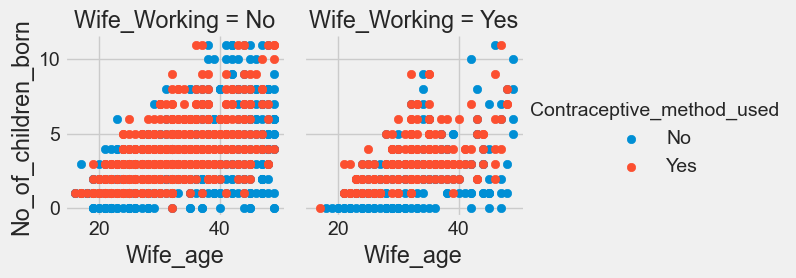

In [175]:
g = sns.FacetGrid(df_contraceptive, col="Wife_Working", hue='Contraceptive_method_used',col_wrap=2, height=3)
g = g.map(plt.scatter, "Wife_age", 'No_of_children_born')
g.add_legend();

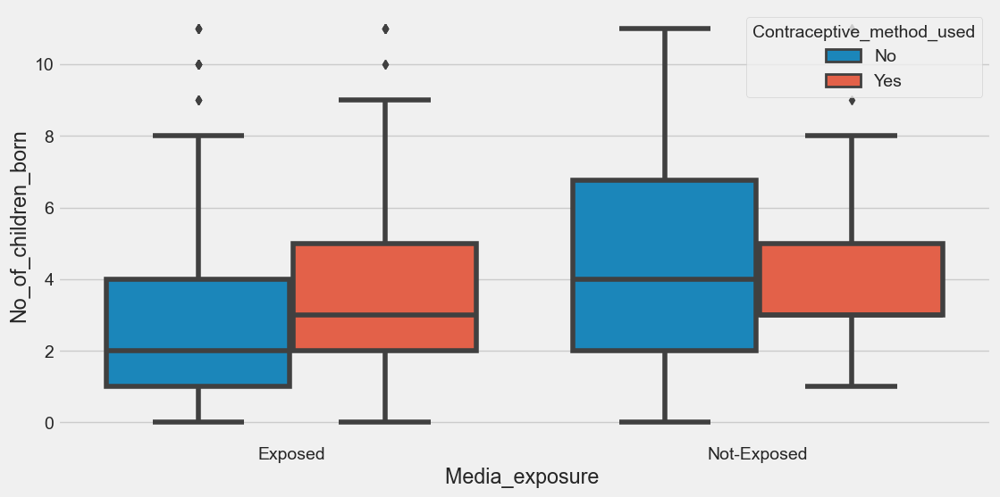

In [176]:
fig_dims = (12, 6)
fig = plt.subplots(figsize=fig_dims)
sns.boxplot(x='Media_exposure ', y='No_of_children_born', hue='Contraceptive_method_used',data=df_contraceptive);

**Insights**

No. of Children born for married women who is not exposed to Media is Higher.

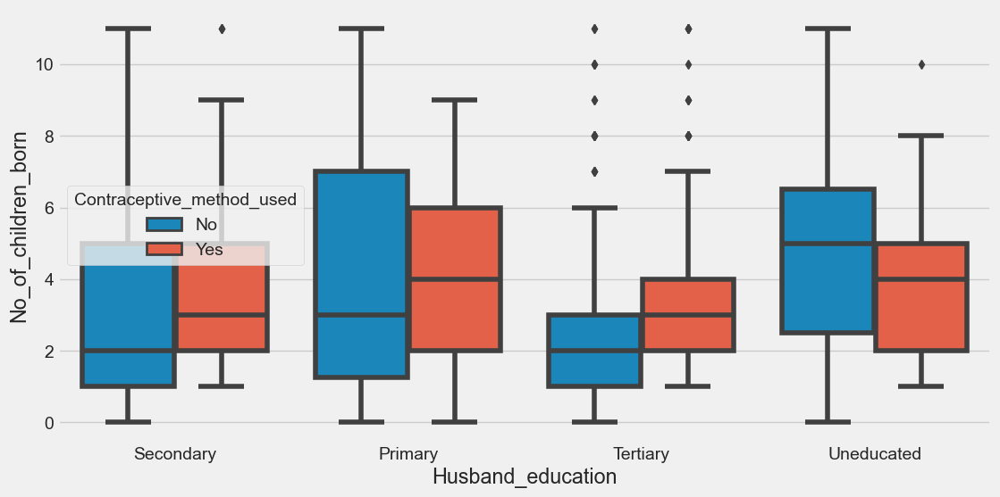

In [177]:
fig_dims = (12, 6)
fig = plt.subplots(figsize=fig_dims)
sns.boxplot(x='Husband_education', y='No_of_children_born', hue='Contraceptive_method_used',data=df_contraceptive);

No.of Children born for Uneducated Husbands is Higher.

<Figure size 800x1000 with 0 Axes>

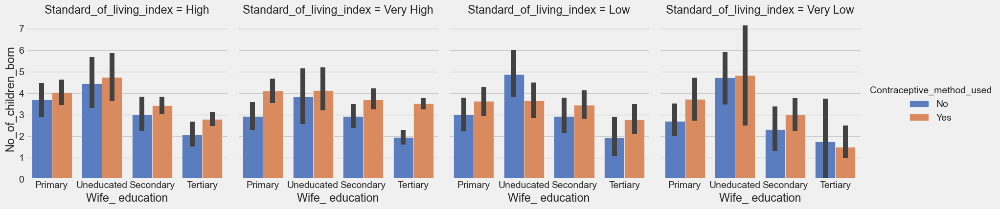

In [178]:
#catplot
plt.figure(figsize=(8,10));
sns.catplot(data=df_contraceptive, x="Wife_ education", y="No_of_children_born", hue="Contraceptive_method_used", col="Standard_of_living_index", kind='bar', palette='muted', height = 4.5);
plt.show();

**Insights**

 * No. of Children born is highest for Uneducated Females who also does not use Contraceptives and their Standard of Living is "Low".
 * No. of Children born is very low to Tertiary educated Women who use Contraceptives but their Standard of living is Very low.
 

### 2.2 Do not scale the data. Encode the data (having string values) for Modelling. Data Split: Split the data into train and test (70:30). Apply Logistic Regression and LDA (linear discriminant analysis) and CART.

In [439]:
df_contraceptive.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1388 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1388 non-null   float64
 1   Wife_ education            1388 non-null   object 
 2   Husband_education          1388 non-null   object 
 3   No_of_children_born        1388 non-null   float64
 4   Wife_religion              1388 non-null   object 
 5   Wife_Working               1388 non-null   object 
 6   Husband_Occupation         1388 non-null   int64  
 7   Standard_of_living_index   1388 non-null   object 
 8   Media_exposure             1388 non-null   object 
 9   Contraceptive_method_used  1388 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 119.3+ KB


In [440]:
df_contraceptive.Contraceptive_method_used.value_counts()

Yes    774
No     614
Name: Contraceptive_method_used, dtype: int64

In [441]:
df_cat.columns

Index(['Wife_ education', 'Husband_education', 'Wife_religion', 'Wife_Working',
       'Standard_of_living_index', 'Media_exposure ',
       'Contraceptive_method_used'],
      dtype='object')

### Converting all objects to categorical codes

In [442]:
## Encoding the 'Wife_education' variable in an ordinal manner

df_contraceptive['Wife_ education']=np.where(df_contraceptive['Wife_ education'] =='Uneducated', '1', df_contraceptive['Wife_ education'])
df_contraceptive['Wife_ education']=np.where(df_contraceptive['Wife_ education'] =='Primary', '2', df_contraceptive['Wife_ education'])
df_contraceptive['Wife_ education']=np.where(df_contraceptive['Wife_ education'] =='Secondary', '3', df_contraceptive['Wife_ education'])
df_contraceptive['Wife_ education']=np.where(df_contraceptive['Wife_ education'] =='Tertiary', '4', df_contraceptive['Wife_ education'])

In [443]:
 ## Encoding the 'Husband_education' variable in an ordinal manner
    
df_contraceptive['Husband_education']=np.where(df_contraceptive['Husband_education'] =='Uneducated', '1', df_contraceptive['Husband_education'])
df_contraceptive['Husband_education']=np.where(df_contraceptive['Husband_education'] =='Primary', '2', df_contraceptive['Husband_education'])
df_contraceptive['Husband_education']=np.where(df_contraceptive['Husband_education'] =='Secondary', '3', df_contraceptive['Husband_education'])
df_contraceptive['Husband_education']=np.where(df_contraceptive['Husband_education'] =='Tertiary', '4', df_contraceptive['Husband_education'])

In [444]:
 ## Encoding the 'Standard_of_living_index' variable in an ordinal manner

df_contraceptive['Standard_of_living_index']=np.where(df_contraceptive['Standard_of_living_index'] =='Very Low', '1', df_contraceptive['Standard_of_living_index'])
df_contraceptive['Standard_of_living_index']=np.where(df_contraceptive['Standard_of_living_index'] =='Low', '2', df_contraceptive['Standard_of_living_index'])
df_contraceptive['Standard_of_living_index']=np.where(df_contraceptive['Standard_of_living_index'] =='High', '3', df_contraceptive['Standard_of_living_index'])
df_contraceptive['Standard_of_living_index']=np.where(df_contraceptive['Standard_of_living_index'] =='Very High', '4', df_contraceptive['Standard_of_living_index'])

In [445]:
 ## Encoding the 'Wife_religion' variable in an ordinal manner

df_contraceptive['Wife_religion']=np.where(df_contraceptive['Wife_religion'] =='Scientology', '1', df_contraceptive['Wife_religion'])
df_contraceptive['Wife_religion']=np.where(df_contraceptive['Wife_religion'] =='Non-Scientology', '0', df_contraceptive['Wife_religion'])

In [446]:
 ## Encoding the 'Wife_Working' variable in an ordinal manner

df_contraceptive['Wife_Working']=np.where(df_contraceptive['Wife_Working'] =='No', '0', df_contraceptive['Wife_Working'])
df_contraceptive['Wife_Working']=np.where(df_contraceptive['Wife_Working'] =='Yes', '1', df_contraceptive['Wife_Working'])


In [447]:
 ## Encoding the 'Media_exposure ' variable in an ordinal manner

df_contraceptive['Media_exposure ']=np.where(df_contraceptive['Media_exposure '] =='Exposed', '1', df_contraceptive['Media_exposure '])
df_contraceptive['Media_exposure ']=np.where(df_contraceptive['Media_exposure '] =='Not-Exposed', '0', df_contraceptive['Media_exposure '])

In [448]:
 ## Encoding the Target Variable 'Contraceptive_method_used' variable in an ordinal manner

df_contraceptive['Contraceptive_method_used']=np.where(df_contraceptive['Contraceptive_method_used'] =='No', '1', df_contraceptive['Contraceptive_method_used'])
df_contraceptive['Contraceptive_method_used']=np.where(df_contraceptive['Contraceptive_method_used'] =='Yes', '0', df_contraceptive['Contraceptive_method_used'])

In [449]:
df_contraceptive.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1388 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1388 non-null   float64
 1   Wife_ education            1388 non-null   object 
 2   Husband_education          1388 non-null   object 
 3   No_of_children_born        1388 non-null   float64
 4   Wife_religion              1388 non-null   object 
 5   Wife_Working               1388 non-null   object 
 6   Husband_Occupation         1388 non-null   int64  
 7   Standard_of_living_index   1388 non-null   object 
 8   Media_exposure             1388 non-null   object 
 9   Contraceptive_method_used  1388 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 119.3+ KB


In [450]:
## Converting the object variable to numeric

df_contraceptive['Wife_ education'] = df_contraceptive['Wife_ education'].astype('int64')
df_contraceptive['Husband_education'] = df_contraceptive['Husband_education'].astype('int64')
df_contraceptive['Wife_religion'] = df_contraceptive['Wife_religion'].astype('int64')
df_contraceptive['Wife_Working'] = df_contraceptive['Wife_Working'].astype('int64')
df_contraceptive['Standard_of_living_index'] = df_contraceptive['Standard_of_living_index'].astype('int64')
df_contraceptive['Media_exposure '] = df_contraceptive['Media_exposure '].astype('int64')
df_contraceptive['Contraceptive_method_used'] = df_contraceptive['Contraceptive_method_used'].astype('int64')

In [451]:
df_contraceptive.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1388 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1388 non-null   float64
 1   Wife_ education            1388 non-null   int64  
 2   Husband_education          1388 non-null   int64  
 3   No_of_children_born        1388 non-null   float64
 4   Wife_religion              1388 non-null   int64  
 5   Wife_Working               1388 non-null   int64  
 6   Husband_Occupation         1388 non-null   int64  
 7   Standard_of_living_index   1388 non-null   int64  
 8   Media_exposure             1388 non-null   int64  
 9   Contraceptive_method_used  1388 non-null   int64  
dtypes: float64(2), int64(8)
memory usage: 119.3 KB


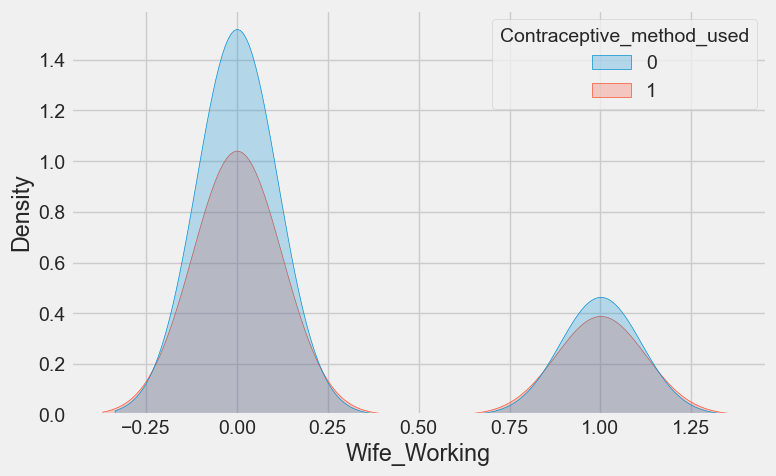

In [512]:
sns.kdeplot(x = df_contraceptive['Wife_Working'] , hue =df_contraceptive['Contraceptive_method_used'] , fill = True );

Working Women use more contraceptives.

**Train Test Split**

In [586]:
# Copy all the predictor variables into X dataframe
X = df_contraceptive.drop('Contraceptive_method_used', axis=1)

# Copy target into the y dataframe. 
y = df_contraceptive['Contraceptive_method_used']

**Split the Data into Train and Test**

In [587]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=1)

## Logistic Regression

In [455]:
from sklearn.linear_model import LogisticRegression

In [456]:
# Fit the model on original data i.e. before upsampling
model_logistic = LogisticRegression()
model_logistic.fit(X_train, y_train)

LogisticRegression()

**Predicting on Training and Test dataset**

In [457]:
ytrain_predict_log = model_logistic.predict(X_train)
ytest_predict_log = model_logistic.predict(X_test)

**Getting the Predicted Classes and Probs**

In [458]:
ytest_predict_prob_log=model_logistic.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob_log).head()

,0,1
0,0.090367,0.909633
1,0.320594,0.679406
2,0.830219,0.169781
3,0.628563,0.371437
4,0.754915,0.245085


## LDA

In [459]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [460]:
#Build LDA Model

lda = LinearDiscriminantAnalysis()
model_lda=lda.fit(X_train, y_train)
model_lda

LinearDiscriminantAnalysis()

**Predicting on Training and Test dataset**

In [461]:
# Training Data Class Prediction with a cut-off value of 0.5
y_train_predict_lda = model_lda.predict(X_train)

# Test Data Class Prediction with a cut-off value of 0.5
y_test_predict_lda = model_lda.predict(X_test)

**Probability prediction for the training and test data**

In [462]:
# Training Data Probability Prediction
y_train_predict_prob_lda = model_lda.predict_proba(X_train)

# Test Data Probability Prediction
y_test_predict_prob_lda = model_lda.predict_proba(X_test)

In [463]:
pd.DataFrame(y_test_predict_prob_lda).head()

,0,1
0,0.095805,0.904195
1,0.334222,0.665778
2,0.835517,0.164483
3,0.635678,0.364322
4,0.760159,0.239841


## CART

In [464]:
# instantiate the Decision Tree model
from sklearn.tree import DecisionTreeClassifier

In [465]:
model_dtree = DecisionTreeClassifier(criterion = 'gini' )
model_dtree.fit(X_train,y_train)

DecisionTreeClassifier()

**Predictions of the model on train and test data**

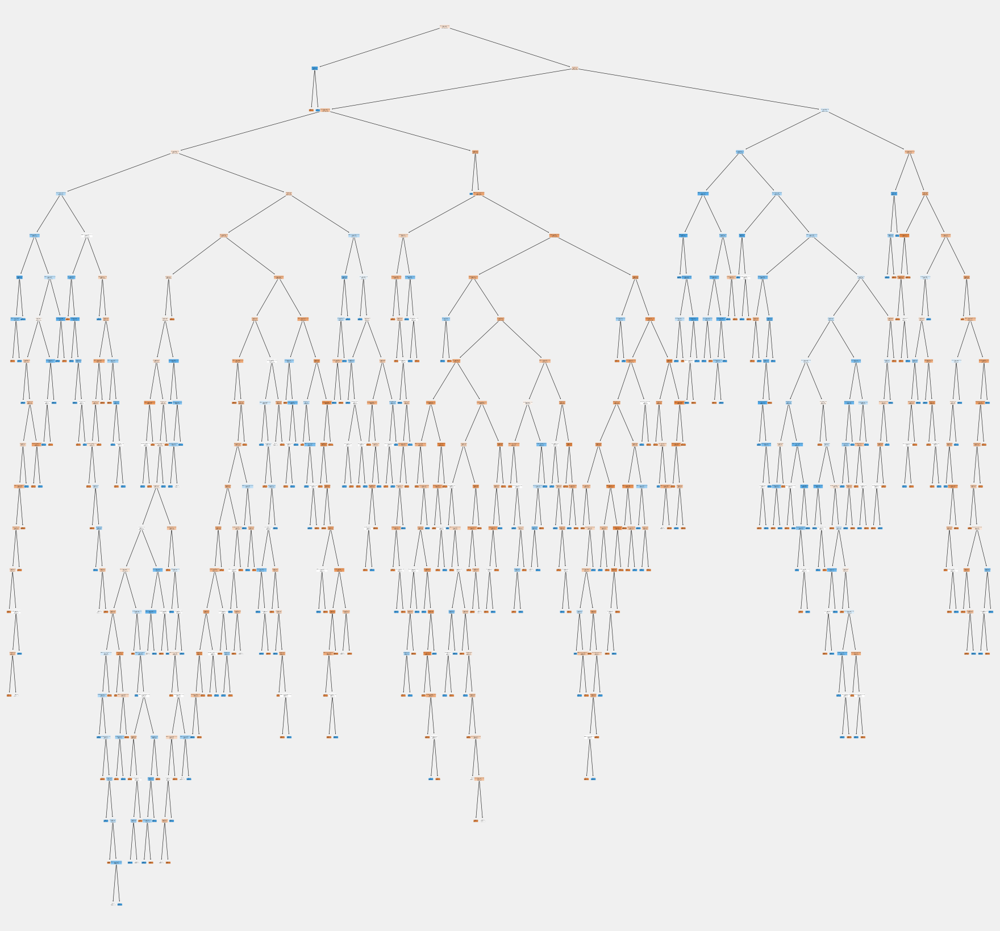

In [466]:
# visualize the decision tree
from sklearn.tree import plot_tree
plt.figure(figsize=(20,20))
plot_tree(model_dtree,feature_names=X.columns,filled=True,rounded=True);

### Regularization of the Decision Tree Model (Pruning)

In [467]:
# Creating a new Decision Tree Model with different hyperparameters instead of using the default ones
dtree_pruned = DecisionTreeClassifier(max_depth= 5, min_samples_leaf=10, min_samples_split=30)

In [468]:
# train the model on the training data
dtree_pruned.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=10, min_samples_split=30)

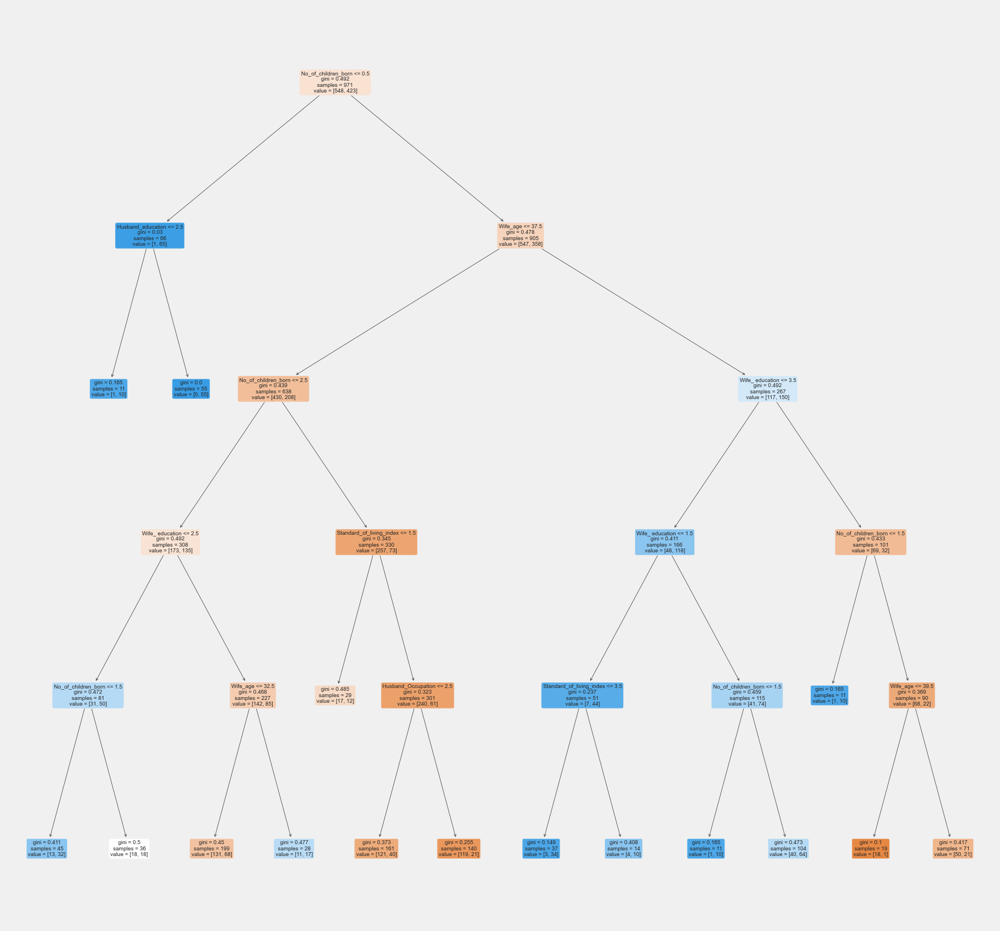

In [469]:
# visualize the decision tree
from sklearn.tree import plot_tree
plt.figure(figsize=(20,20))
plot_tree(dtree_pruned,feature_names=X.columns,filled=True,rounded=True);

In [470]:
# get the predictions on train and test data
pred_train_dtree = dtree_pruned.predict(X_train)
pred_test_dtree = dtree_pruned.predict(X_test)

In [471]:
# create a dataframe of feature importances
feat_df = pd.DataFrame({'Features':X.columns,'Importance':dtree_pruned.feature_importances_})
feat_df.sort_values(by='Importance',ascending=False)

,Features,Importance
3,No_of_children_born,0.534367
1,Wife_ education,0.228856
0,Wife_age,0.199988
7,Standard_of_living_index,0.024533
6,Husband_Occupation,0.011097
2,Husband_education,0.001158
4,Wife_religion,0.000000
5,Wife_Working,0.000000
8,Media_exposure,0.000000


**Insights**

•	We can see that “No_of_children_born” has 53% significance in predicting the Target variable. Followed by”wife_Education” which has 22.8% importance. “Wife_age” has 19.9% significance. 

•	On the whole, the first 3 important features contributes 96.1% significance and importance in predicting the “Contraceptive_method_used” Target variable.


### 2.3 Performance Metrics: Check the performance of Predictions on Train and Test sets using Accuracy, Confusion Matrix, Plot ROC curve and get ROC_AUC score for each model Final Model: Compare Both the models and write inference which model is best/optimized.

### Model Evaluation

In this problem, FN - False negative misclassification is much more costlier than FP - False positive. so RECALL is a better metric to evaluate the model.

## 1. Accuracy

**a) Logistic Regression**

In [472]:
# Accuracy - Training Data - Logistic
log_train = model_logistic.score(X_train, y_train)
print("The Accuracy of Train data using Logistic Regression Model is ", log_train)

The Accuracy of Train data using Logistic Regression Model is  0.6848609680741503


In [473]:
# Accuracy - Testing Data - Logistic
log_test = model_logistic.score(X_test, y_test)
print("The Accuracy of Test data using Logistic Regression Model is ", log_test)

The Accuracy of Test data using Logistic Regression Model is  0.6522781774580336


**b) LDA**

In [474]:
# Accuracy - Training Data - LDA
lda_train = model_lda.score(X_train, y_train)
print("The Accuracy of Train data using LDA Model is ", lda_train)

The Accuracy of Train data using LDA Model is  0.6797116374871267


In [588]:
# Accuracy - Test Data - LDA
lda_test = model_lda.score(X_test, y_test)
print("The Accuracy of Test data using LDA Model is ", lda_test)

The Accuracy of Test data using LDA Model is  0.6546762589928058


**c) CART**

In [476]:
# Accuracy - Training Data - CART
model_dtree.score(X_train, y_train)


0.9835221421215242

In [477]:
# Accuracy - Test Data - CART
model_dtree.score(X_test, y_test)


0.592326139088729

**Pruned D-tree score**

In [478]:
cart_train = dtree_pruned.score(X_train, y_train)
print("The Accuracy of Train data using CART Model after Pruning is ", cart_train)

The Accuracy of Train data using CART Model after Pruning is  0.737384140061792


In [479]:
cart_test = dtree_pruned.score(X_test, y_test)
print("The Accuracy of Test data using CART Model after Pruning is ", cart_test)

The Accuracy of Test data using CART Model after Pruning is  0.6930455635491607


**Insights**

 * CART model performs better than LDA and Logistic models

In [480]:
model_logistic.intercept_

array([0.82295227])

In [481]:
model_lda.intercept_

array([0.83939153])

In [482]:
dtree_pruned.n_features_

9

In [483]:
dtree_pruned.feature_names_in_

array(['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index',
       'Media_exposure '], dtype=object)

## 2. CONFUSION MATRIX

**Training Data and Test Data Confusion Matrix Comparison**

**a) Logistic Regression**

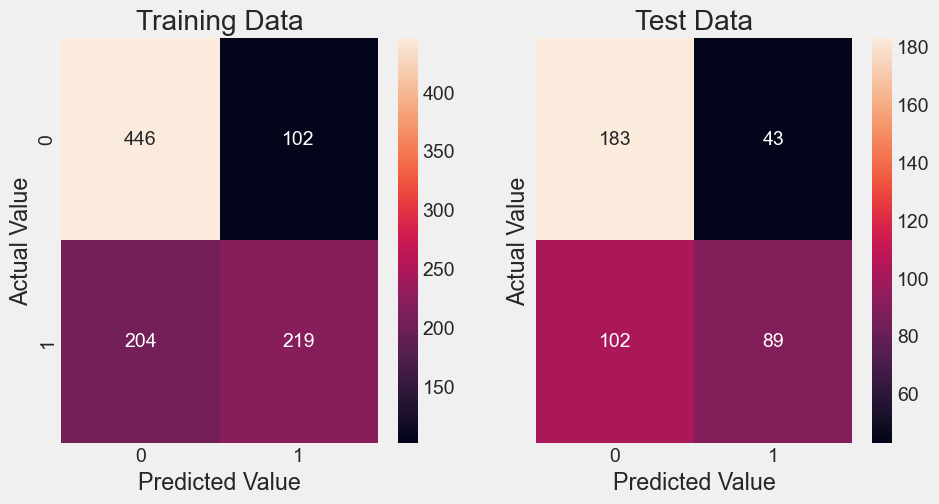

In [484]:
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False, figsize=(10,5))


#Plotting confusion matrix for the different models for the Training Data

plot_0 = sns.heatmap((metrics.confusion_matrix(y_train,ytrain_predict_log)),annot=True,fmt='.5g',ax=a[0][0]);
a[0][0].set_title('Training Data')
a[0][0].set_ylabel('Actual Value')
a[0][0].set_xlabel('Predicted Value')
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,ytest_predict_log)),annot=True,fmt='.5g',ax=a[0][1]);
a[0][1].set_title('Test Data');
a[0][1].set_ylabel('Actual Value')
a[0][1].set_xlabel('Predicted Value');

Insights:

•	FN value is 204 in Train data and 102 in Test Data. 
•	Comparatively more than FP which is 102 in Train data and 43 in Test data.
•	TN value is 446 and TP value is 219 and 183 , 89 in Test data.


**a) LDA**

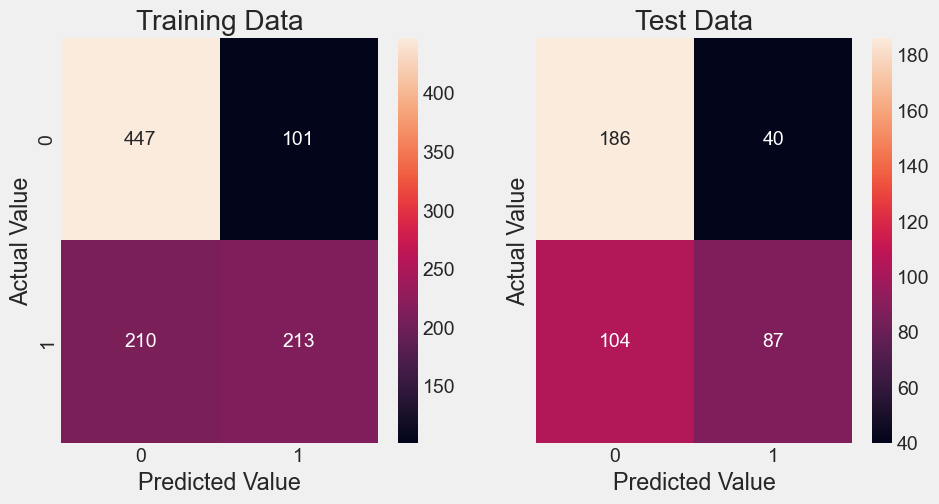

In [485]:
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False, figsize=(10,5))


#Plotting confusion matrix for the different models for the Training Data

plot_0 = sns.heatmap((metrics.confusion_matrix(y_train,y_train_predict_lda)),annot=True,fmt='.5g',ax=a[0][0]);
a[0][0].set_title('Training Data')
a[0][0].set_ylabel('Actual Value')
a[0][0].set_xlabel('Predicted Value')
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,y_test_predict_lda)),annot=True,fmt='.5g',ax=a[0][1]);
a[0][1].set_title('Test Data');
a[0][1].set_ylabel('Actual Value')
a[0][1].set_xlabel('Predicted Value');

Insights:

•	FN value is 210 in Train data and 104 in Test Data. 
•	Comparatively more than FP which is 101 in Train data and 40 in Test data.
•	TN value is 447 and TP value is 213 in Train data and 186 , 87 in Test data..


**c) CART**

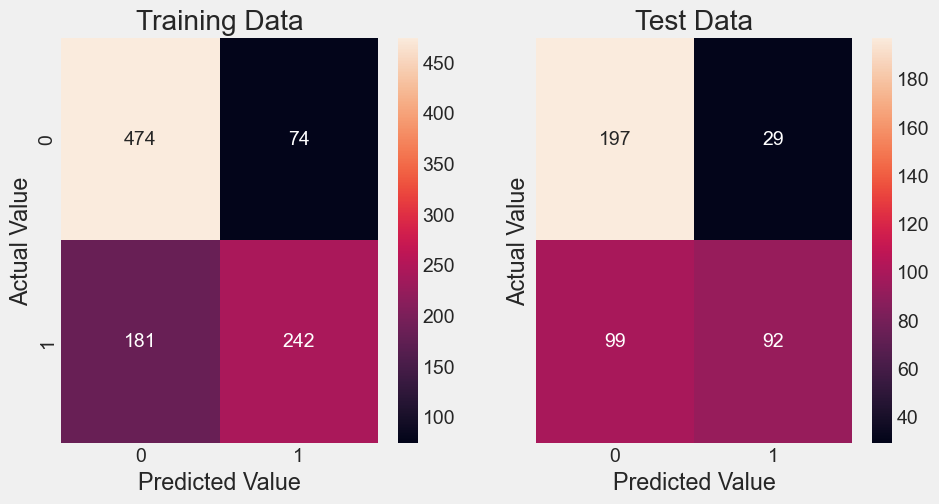

In [486]:
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False, figsize=(10,5))


#Plotting confusion matrix for the different models for the Training Data

plot_0 = sns.heatmap((metrics.confusion_matrix(y_train,pred_train_dtree)),annot=True,fmt='.5g',ax=a[0][0]);
a[0][0].set_title('Training Data')
a[0][0].set_ylabel('Actual Value')
a[0][0].set_xlabel('Predicted Value')
plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,pred_test_dtree)),annot=True,fmt='.5g',ax=a[0][1]);
a[0][1].set_title('Test Data');
a[0][1].set_ylabel('Actual Value')
a[0][1].set_xlabel('Predicted Value');

 Insights:
 
•	FN value is 181 in Train data and 99 in Test Data. 
•	Comparatively more than FP which is 74 in Train data and 29 in Test data.
•	TN value is 474 and TP value is 242 in Train data and 197, 92 in Test data..


## 3. CLASSIFICATION REPORT

**Training Data and Test Data Classification Report Comparison**

**a) Logistic Regression**

In [487]:
print('Classification Report of the training data:\n\n',metrics.classification_report(y_train,ytrain_predict_log),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(y_test,ytest_predict_log),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.69      0.81      0.74       548
           1       0.68      0.52      0.59       423

    accuracy                           0.68       971
   macro avg       0.68      0.67      0.67       971
weighted avg       0.68      0.68      0.68       971
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.64      0.81      0.72       226
           1       0.67      0.47      0.55       191

    accuracy                           0.65       417
   macro avg       0.66      0.64      0.63       417
weighted avg       0.66      0.65      0.64       417
 



Insights:

•	We can see that Recall score of the Logistic Model is 0.52 for Females who do not use Contraceptive. This means that the model is able to provide only 52% actual True values as True values. 
•	It means the model is not able to optimally reduce the False Negative (FN). The Test data performance is even lesser than Train data which is 47%.


**b) LDA**

In [506]:
print('Classification Report of the training data:\n\n',metrics.classification_report(y_train,y_train_predict_lda),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(y_test,y_test_predict_lda),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.68      0.82      0.74       548
           1       0.68      0.50      0.58       423

    accuracy                           0.68       971
   macro avg       0.68      0.66      0.66       971
weighted avg       0.68      0.68      0.67       971
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.64      0.82      0.72       226
           1       0.69      0.46      0.55       191

    accuracy                           0.65       417
   macro avg       0.66      0.64      0.63       417
weighted avg       0.66      0.65      0.64       417
 



Insights:

•	We can see that Recall score of the LDA Model is 0.50 for Females who do not use Contraceptive. This means that the model is able to provide only 50% actual True values as True values. 
•	It means the model is not able to optimally reduce the False Negative (FN). 50% False Prediction is present. The Test data performance is even lesser than Train data which is only 46%.


**c) CART**

In [507]:
print('Classification Report of the training data:\n\n',metrics.classification_report(y_train,pred_train_dtree),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(y_test,pred_test_dtree),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.72      0.86      0.79       548
           1       0.77      0.57      0.65       423

    accuracy                           0.74       971
   macro avg       0.74      0.72      0.72       971
weighted avg       0.74      0.74      0.73       971
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.67      0.87      0.75       226
           1       0.76      0.48      0.59       191

    accuracy                           0.69       417
   macro avg       0.71      0.68      0.67       417
weighted avg       0.71      0.69      0.68       417
 



 Insights:
 
•	We can see that Recall score of the CART Model is 0.57 for Females who do not use Contraceptive. This means that the model is able to provide only 57% actual True values as True values. 
•	It means the model is comparatively able to reduce the False Negative (FN). But 43% False Prediction is present. The Test data performance is even lesser than Train data which is only 48%.


## 4. AUC & ROC CURVE

### **a) Logistic Regression**

**AUC and ROC for the training data**

AUC score of Train data using Logistic Model is: 0.714


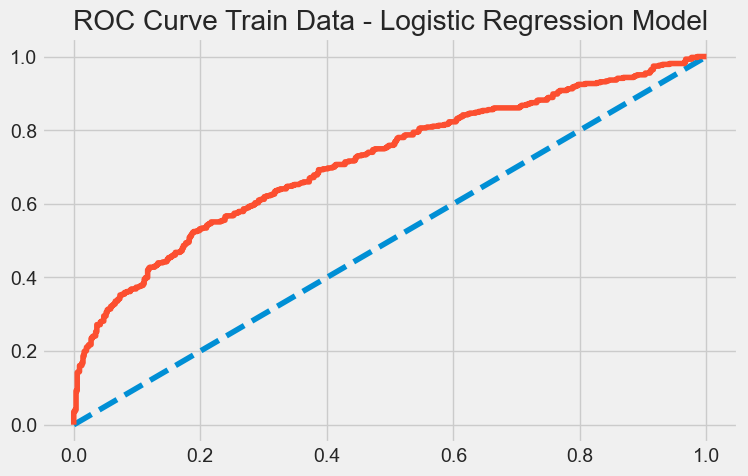

In [490]:
# predict probabilities
probs = model_logistic.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc_log = roc_auc_score(y_train, probs)
print('AUC score of Train data using Logistic Model is: %.3f' % auc_log)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.title("ROC Curve Train Data - Logistic Regression Model")
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

 Insights:
 
•	We can see that AUC score for Train data in the Logistic Model is 0.714. This means that 71.4% chance that the model will be able to distinguish between positive class and negative class.


**AUC and ROC for the test data**

AUC score of Test data using Logistic Model is: 0.679


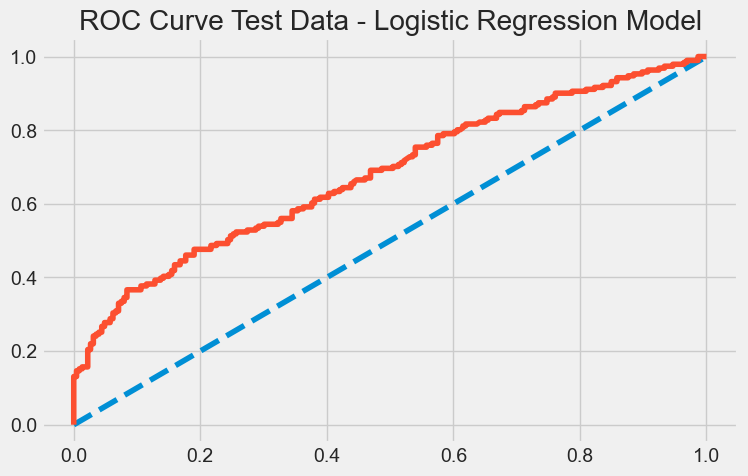

In [491]:
# predict probabilities
probs = model_logistic.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC score of Test data using Logistic Model is: %.3f' % test_auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.title("ROC Curve Test Data - Logistic Regression Model")
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

Insights:

•	We can see that AUC score of Test data in Logistic Model is 0.679. This means that 67.9% chance that the model will be able to distinguish between positive class and negative class.
•	Compared to Train data, this performance is less.


### **b) LDA**

**AUC and ROC for the training data**

AUC score of Train data using LDA Model is: 0.713


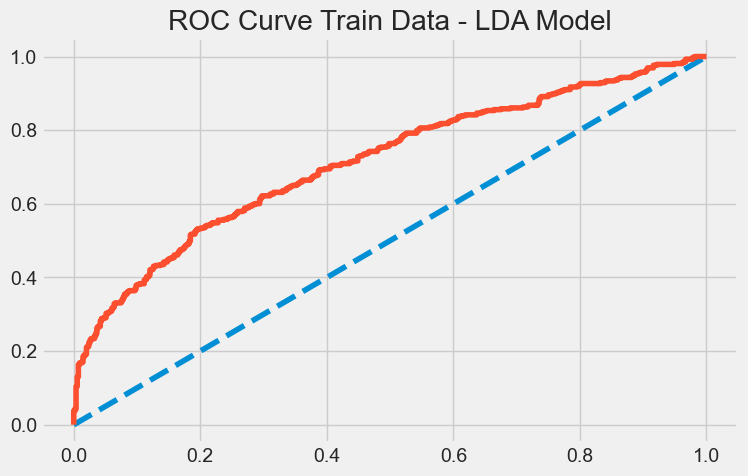

In [492]:
# predict probabilities
probs = model_lda.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
train_auc_lda = roc_auc_score(y_train, probs)
print('AUC score of Train data using LDA Model is: %.3f' % train_auc_lda)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.title("ROC Curve Train Data - LDA Model")
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

Insights:
       
•	We can see that AUC score for Train data in the LDA Model is 0.713. This means that 71.3% chance that the model will be able to distinguish between positive class and negative class.


**AUC and ROC for the test data**

AUC score of Test data using LDA is: 0.678


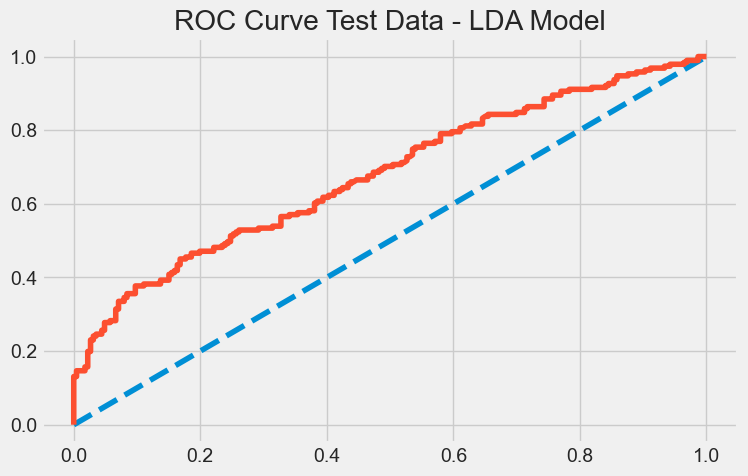

In [493]:
# predict probabilities
probs = model_lda.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc_lda = roc_auc_score(y_test, probs)
print('AUC score of Test data using LDA is: %.3f' % test_auc_lda)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.title("ROC Curve Test Data - LDA Model")
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

Insights:

•	We can see that AUC score of Test data in Logistic Model is 0.678. This means that 67.8% chance that the model will be able to distinguish between positive class and negative class.
•	Compared to Train data, this performance is less.


### **3) CART**

**AUC and ROC for the train data**

AUC score of Train data using CART Model is: 0.787


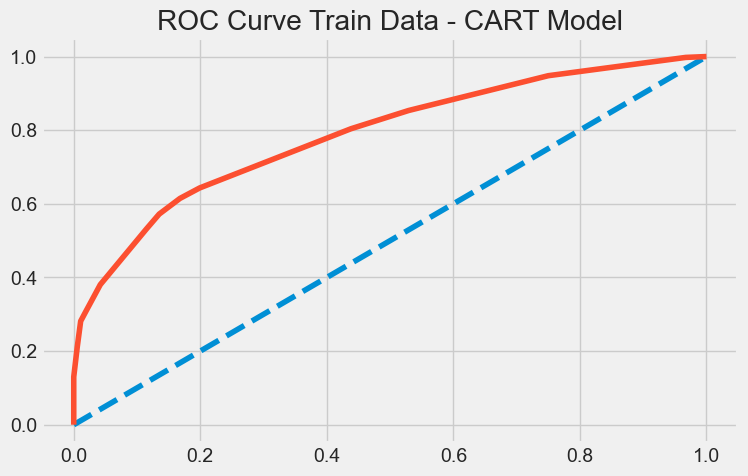

In [494]:
# predict probabilities
probs = dtree_pruned.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc_cart = roc_auc_score(y_train, probs)
print('AUC score of Train data using CART Model is: %.3f' % auc_cart)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.title("ROC Curve Train Data - CART Model")
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

Insights:

•	We can see that AUC score for Train data in the LDA Model is 0.787. This means that 78.7% chance that the model will be able to distinguish between positive class and negative class.


**AUC and ROC for the test data**

AUC score of Test data using CART Model is: 0.742


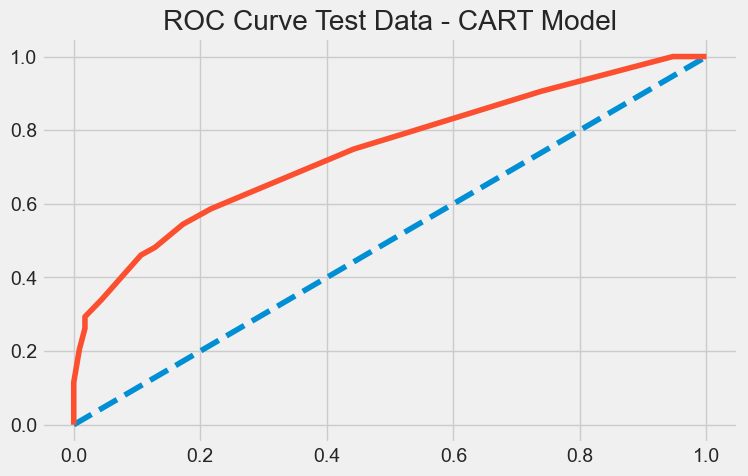

In [495]:
# predict probabilities
probs = dtree_pruned.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc_cart = roc_auc_score(y_test, probs)
print('AUC score of Test data using CART Model is: %.3f' % test_auc_cart)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.title("ROC Curve Test Data - CART Model")
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

 Insights:
 
•	We can see that AUC score of Test data in Logistic Model is 0.742. This means that 74.2% chance that the model will be able to distinguish between positive class and negative class.
•	Compared to Train data, this performance is less


### Final Model: Compare Both the models and write inference which model is best/optimized

In [496]:
# let's check the RMSE on the train data
rmse1_log = np.sqrt(mean_squared_error(y_train, ytrain_predict_log))
print("The RMSE value on Train Data using Logistic Model is ",rmse1_log )

The RMSE value on Train Data using Logistic Model is  0.561372453835998


In [497]:
# let's check the RMSE on the train data
rmse2_log = np.sqrt(mean_squared_error(y_test, ytest_predict_log))
print("The RMSE value on Test Data using Logistic Model is ",rmse2_log )

The RMSE value on Test Data using Logistic Model is  0.5896794235361842


In [509]:
# let's check the RMSE on the train data
rmse1_lda = np.sqrt(mean_squared_error(y_train, y_train_predict_lda))
print("The RMSE value on Train Data using LDA Model is ",rmse1_lda )

The RMSE value on Train Data using LDA Model is  0.5659402464155322


In [508]:
# let's check the RMSE on the train data
rmse2_lda = np.sqrt(mean_squared_error(y_test, y_test_predict_lda))
print("The RMSE value on Test Data using LDA Model is ",rmse2_lda )

The RMSE value on Test Data using LDA Model is  0.5876425282492701


In [510]:
# let's check the RMSE on the train data
rmse1_cart = np.sqrt(mean_squared_error(y_train, pred_train_dtree))
print("The RMSE value on Train Data using CART Model is ",rmse1_cart )

The RMSE value on Train Data using CART Model is  0.5124605935466726


In [511]:
# let's check the RMSE on the train data
rmse2_cart = np.sqrt(mean_squared_error(y_test, pred_test_dtree))
print("The RMSE value on Test Data using CART Model is ",rmse2_cart )

The RMSE value on Test Data using CART Model is  0.5540346888515549


**Model Comparison**

**We compare the Models based on Accuracy, Recall, F-1score, AUC score, RMSE values**

Insights:

*	The Accuracy of CART Model in both Train and Test dataset is comparatively higher than Logistic and LDA model.
*	In this problem, we consider RECALL score as most important because it decreases when the False Negative (FN) increases.
*	Here, Married Females who have not used contraceptives are taken as ’1’ during Encoding. Hence, the False Negative is costlier than False Positive because a Female who has not used contraceptive when counted as used might contribute to False Negative which is costlier than False Positive where a Female who used Contraceptive is counted as Not used..
*	While comparing False Negative score in Confusion Matrix for three models, CART Model performed better. 
*	From (Figure.33), Confusion Matrix we can see that the number of False Negative is comparatively lesser than other models.
*	In F-1 Score, the CART Model performs better as the value when Actual value is ‘0’ (Contraceptive not used) is 0.79 for Train and 0.75 for Test data.
*	In AUC score, the CART Model score is 0.787 in Train data and 0.512 in Test data.
*	RMSE Values for CART model is comparatively lesser than Logistic model or LDA model.

Thus CART MODEL is the best optimal model for predicting whether the married women use Contraceptives or not. CART Model can comparatively reduce the Type 2 Error which is in this case reducing False Negatives (FN) and increasing the Recall Score. The comparability of these values suggests that our CART model is unbiased and hence a good fit.



### 2.4 Inference: Basis on these predictions, what are the insights and recommendations. Please explain and summarise the various steps performed in this project. There should be proper business interpretation and actionable insights present.

**Summary of Learnings**

In the Contraceptive Prevalence Survey Problem, the following were learned
1.	Data has been loaded correctly into the pandas dataframe
2.	There are 1473 rows and 10 features with 7 object datatypes and 3 int datatypes.
3.	The missing value treatment for two features “Wife_age" and "No_of_children_born" was done using median filler.
4.	There were 85 duplicate rows which was dropped. Then the no. of records to be modelled dropeed to 1388.
5.	The outlier’s were detected and treated using IQR method. This had an effect on quality of Models built.
6.	Univariate, Bivariate, Multivariate Analysis of dataset was done.
7.	Label Encoding for Ordinal Features were done. Accordingly the columns “Wife_education” , “Husband_education”, “Standard_of_living_index”, “Wife_religion”, “Wife_Working”, “Media_exposure”, “Contraceptive_method_used” were all encoded.
8.	Datatype conversion of all encoded object variable to numeric variable was done.
9.	The Predictor variables was copied into “X” dataframe and the Target variable was copied into “y” dataframe.
10.	The data was split into Train and Test set at 70:30 ratio.
11.	Logistic Regression, Linear Discriminant Analysis , CART Models were performed for all the Train data.
12.	For CART Model, the Pruning technique was used in order to avoid over fitting of the model.
13.	Model Evaluation was done based on the following.
	Accuracy
	Confusion Matrix
	AUC score – ROC curve
	RMSE
14.	Classification Report for all the models was generated which had Recall, Precision,  F-1 Score, Accuracy to evaluate the Model.
15.	After comparison of all 3 models, CART model was chosen as the Best Optimal Model in predicting the Target variable “Contraceptive_method_used”.
16.	Attributes that contribute for women in order to use the Contraceptives and their significance were learned.

**Further Insights**

1.	We can see that Average age of a married women surveyed is between 30-35 years.
2.	The number of children for every married women falls between 2-3.
3.	Most of the married women Husband’s occupation is 3 (which is random occupation)
4.	Married Women and their Husband’s are mostly graduated. (Tertiary Education).
5.	Around 85% of married women have completed Primary Education
6.	They follow “Scientology” religion which means a religious system based on the seeking of self-knowledge and spiritual fulfilment through graded courses of study and training. Hence this shows that they are well educated.
7.	Around 72% of married women are Not working. Inspite of 85 % Literacy rate.
8.	75 % of married women are living in High Standards.
9.	Only 11% of Married women are exposed to Media. 
10.	More than 50% married women use contraceptive.
11.	Female Scientologist use more Contraceptives than non- Scientologist.
12.	40% of Working Women do not use Contraceptive methods.
13.	50% of Married women who have very High standard of living do not use contraceptives.
14.	No. of Children born for married women who is not exposed to Media is Higher.
15.	No. of Children born for Uneducated Husbands is Higher.
16.	“Wife_Age” between 20-30 years in Not working women and 20-35 years in Working Women do not use contraceptives.

**Conclusion & Recommendation**

1.	Most of the Married women are not working. Educated and staying in home without working leads to less media exposure. This leads to unawareness of Contraceptive usage.  
2.	Married women has to be given jobs according to their Education.
3.	Educated and Married women and men need to be given Public awareness on Contraceptive methods and the Problem of Overpopulation.
4.	Scientologist religion followers have to create a community forum on usage of contraceptives.
5.	In workplace, public awareness has to be created for Married Working women to follow contraceptive measures to control population rate.
6.	High Standard of living denotes the community is performing well in Basic needs. But the awareness of those people towards Contraceptives is less. Hence Community Programs need to be launched which prioritizes the importance of Contraceptives.
7.	Government can take measures to put advertisements, plan relevant Birth Control Programs and Schemes to encourage usage of contraceptives in order to curb population.
8.	In order to implement this, Media in various forms like Social Media Advertisements (Facebook, YouTube, and Google Ads) that can use AI to personalize the Adult Advertisements that can be seen by especially the Married women can be done.
9.	No. of Children born for Uneducated Husbands is higher. Hence, Education to both Men and Women is necessary.
10.	Married Women between Age 20 to 35 years is the important category in order to provide any awareness or measures.
11.	Government Rehabilitation schemes to increase the People in Low standard of living is an important factor for exposure of contraceptives usage to married women
12.	 Measures to be taken by Government of Indonesia, to provide the follow the suggestions and plausibility of making into action in order to create awareness to Married Women on the usage of Contraceptives which indirectly controls the population.

**Thus the above recommendations can be implemented in order to increase the usage of Contraceptives among Married Women in Indonesia. This is Birth control measure that can increase the efficiency and working of the Government of Indonesia.**
